# Testing notebook for nifty fit on atmosphere TODs directly (no image)

# Try to add a nifty model for sampling the input map

numpy version: 2.1.1


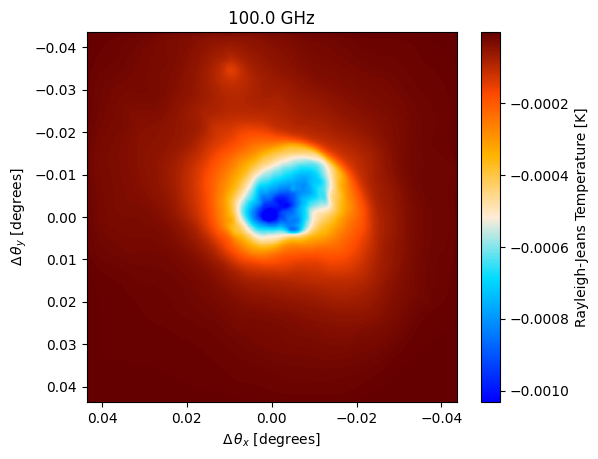

In [1]:
import numpy as np
print(f"numpy version: {np.__version__}")
import matplotlib.pyplot as plt
import maria
import sys
import os

# Relative import of sample_maps for now
sys.path.append(os.path.abspath('../python'))
import mapsampling_jax
from mapsampling_jax import sample_maps

map_filename = maria.io.fetch("maps/cluster.fits")

# load in the map from a fits file
input_map = maria.map.read_fits(filename=map_filename, #filename
                                resolution=-8.714e-05, #pixel size in degrees
                                index=0, #index for fits file
                                center=(150, 10), # position in the sky
                                units='Jy/pixel' # Units of the input map 
                               )

input_map.to(units="K_RJ").plot()

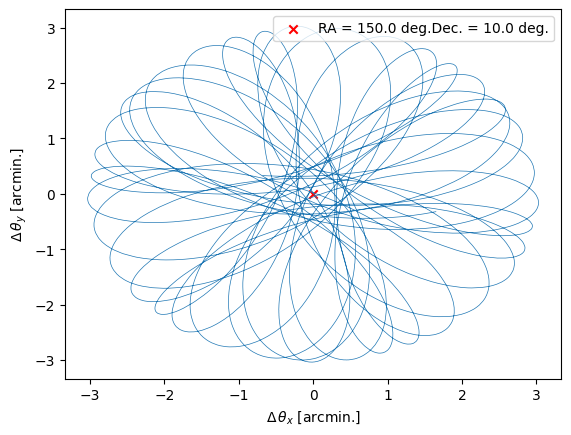

In [2]:
#load the map into maria
plan = maria.get_plan(scan_pattern="daisy", # scanning pattern
                      scan_options={"radius": 0.05, "speed": 0.01}, # in degrees
                      duration=600, # integration time in seconds
                      # duration=300, # integration time in seconds
                      sample_rate=50, # in Hz
                      scan_center=(150, 10), # position in the sky
                      frame="ra_dec")

plan.plot()

2024-10-09 15:06:30.910 INFO: Constructed instrument.
2024-10-09 15:06:30.911 INFO: Constructed plan.
2024-10-09 15:06:30.912 INFO: Constructed site.
2024-10-09 15:06:31.631 INFO: Constructed boresight.
2024-10-09 15:06:33.312 INFO: Constructed offsets.


Initialized base in 2403 ms.


Generating noise: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]
Generating atmosphere: 4it [00:01,  3.06it/s]
Sampling map (m2/f093): 100%|██████████| 1/1 [00:09<00:00,  9.19s/it]


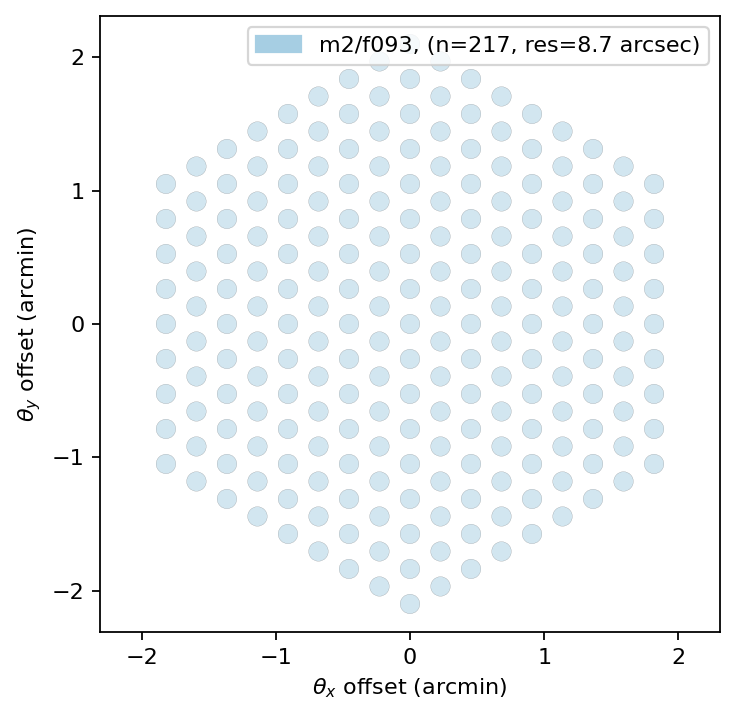

In [3]:
# instrument = maria.get_instrument('MUSTANG-2')
instrument = mapsampling_jax.instrument
instrument.plot()

sim_truthmap = maria.Simulation(instrument, 
                                plan=plan,
                                site="llano_de_chajnantor", 
                                map=input_map,
                                # noise=False,
                                atmosphere="2d",
                                # cmb="generate",
                                )

tod_truthmap = sim_truthmap.run()

In [4]:
dx, dy = sim_truthmap.coords.offsets(frame=sim_truthmap.map.frame, center=sim_truthmap.map.center)
dx = dx.compute()
dy = dy.compute()

dx

array([[-1.96240674e-04, -1.93090613e-04, -1.90091664e-04, ...,
         4.73779999e-04,  4.76548186e-04,  4.79748222e-04],
       [-2.45368534e-04, -2.42218725e-04, -2.39220012e-04, ...,
         4.28425208e-04,  4.31193157e-04,  4.34392901e-04],
       [-1.21051824e-04, -1.17901819e-04, -1.14902918e-04, ...,
         5.49657489e-04,  5.52425644e-04,  5.55625644e-04],
       ...,
       [ 1.21593377e-04,  1.24745513e-04,  1.27746390e-04, ...,
         7.60740787e-04,  7.63510910e-04,  7.66713311e-04],
       [-4.04728576e-04, -4.01576046e-04, -3.98574837e-04, ...,
         2.29598350e-04,  2.32368701e-04,  2.35571352e-04],
       [-7.45629494e-04, -7.42479600e-04, -7.39480837e-04, ...,
        -7.21945291e-05, -6.94266221e-05, -6.62269545e-05]])

Running mapper (m2/f093): 100%|██████████| 1/1 [00:05<00:00,  5.92s/it]


mapdata_truth shape: (1, 1000, 1000)
mapdata_truth mean: -8.726028151723567e-05


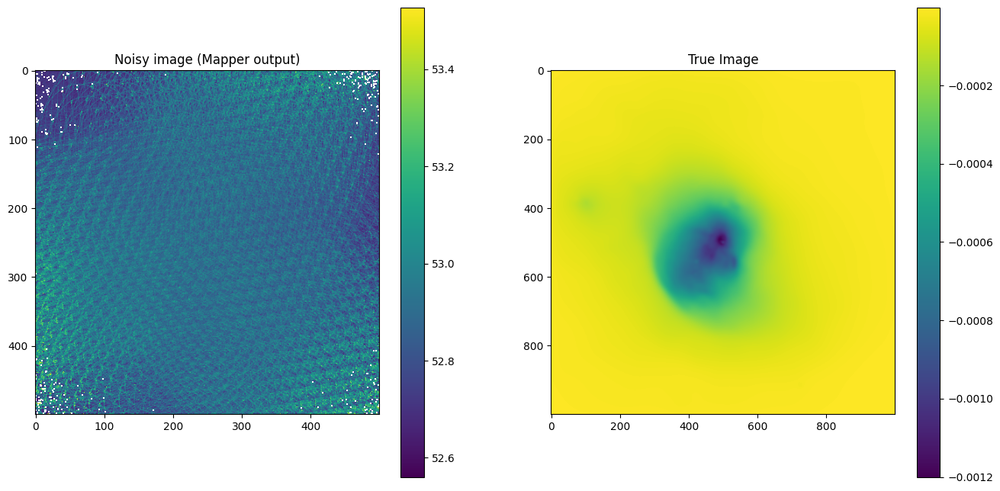

In [5]:
from maria.map.mappers import BinMapper

# Run mapper without any filtering to get noisy mimge
mapper_truthmap = BinMapper(center=(150, 10), frame="ra_dec", width=0.1, height=0.1, resolution=2e-4, map_postprocessing={"gaussian_filter": {"sigma": 0}} )
mapper_truthmap.add_tods(tod_truthmap)
output_truthmap = mapper_truthmap.run()

mapdata_truth = np.float64(sim_truthmap.map.data)
mapdata_truth = np.nan_to_num(mapdata_truth, nan=np.nanmean(mapdata_truth)) # replace nan value by img mean

print("mapdata_truth shape:", mapdata_truth.shape)
print("mapdata_truth mean:", mapdata_truth.mean())

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

im0 = axes[0].imshow(output_truthmap.data[0].T)
fig.colorbar(im0)
axes[0].title.set_text("Noisy image (Mapper output)")

im1 = axes[1].imshow(mapdata_truth[0])
fig.colorbar(im1)
axes[1].title.set_text("True Image")

plt.show()

# Re-implement map sampling in JAX for nifty response function:

In [6]:
os.environ['CUDA_VISIBLE_DEVICES'] = '2'

import jax
from jax import random
import jax.numpy as jnp

import nifty8.re as jft
import matplotlib.pyplot as plt

import numpy as np

from functools import reduce
from operator import or_

seed = 42
key = random.PRNGKey(seed)

2024-10-09 15:07:03.849 INFO: Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
2024-10-09 15:07:03.851 INFO: Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory


# Test TOD agreement:

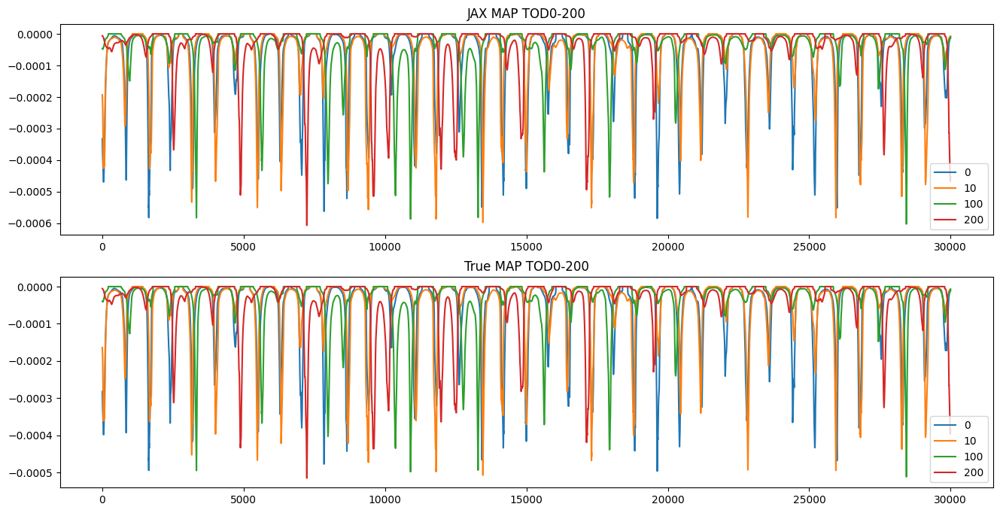

In [7]:
jax_tods_map = sample_maps(mapdata_truth, dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)

fig, axes = plt.subplots(2, 1, figsize=(16, 8))

for i in [0, 10, 100, 200]:
    im0 = axes[0].plot(jax_tods_map[i], label=i)

    tods_map = np.float64(tod_truthmap.components['map'].compute())
    im1 = axes[1].plot(tods_map[i], label=i)
    
axes[0].title.set_text(f'JAX MAP TOD0-{i}')
axes[0].legend()
axes[1].title.set_text(f'True MAP TOD0-{i}')
axes[1].legend()

plt.show()

# Smooth atmosphere TODs:

In [8]:
import scipy as sp

jax_tods_atmos = tod_truthmap.components['atmosphere']
jax_tods_atmos_smooth = np.zeros(jax_tods_atmos.shape)

for i in range(jax_tods_atmos.shape[0]):
    jax_tods_atmos_smooth[i] = sp.ndimage.gaussian_filter1d(jax_tods_atmos[i], sigma=2e2)

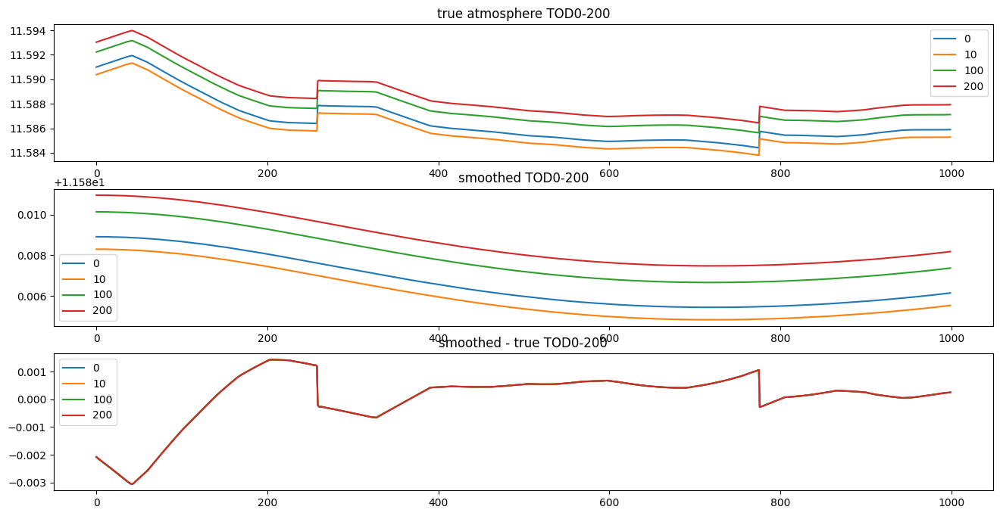

In [9]:
# plot smoothed atmos:

fig, axes = plt.subplots(3, 1, figsize=(16, 8))

for i in [0, 10, 100, 200]:
    im0 = axes[0].plot(jax_tods_atmos[i, 0:1000], label=i)
    im1 = axes[1].plot(jax_tods_atmos_smooth[i, 0:1000], label=i)
    im2 = axes[2].plot(jax_tods_atmos_smooth[i, 0:1000] - jax_tods_atmos[i, 0:1000], label=i)
    
axes[0].title.set_text(f'true atmosphere TOD0-{i}')
axes[0].legend()
axes[1].title.set_text(f'smoothed TOD0-{i}')
axes[1].legend()
axes[2].title.set_text(f'smoothed - true TOD0-{i}')
axes[2].legend()

plt.show()

# Prepare noised input TODs:

Noise stddev: 0.00025149333


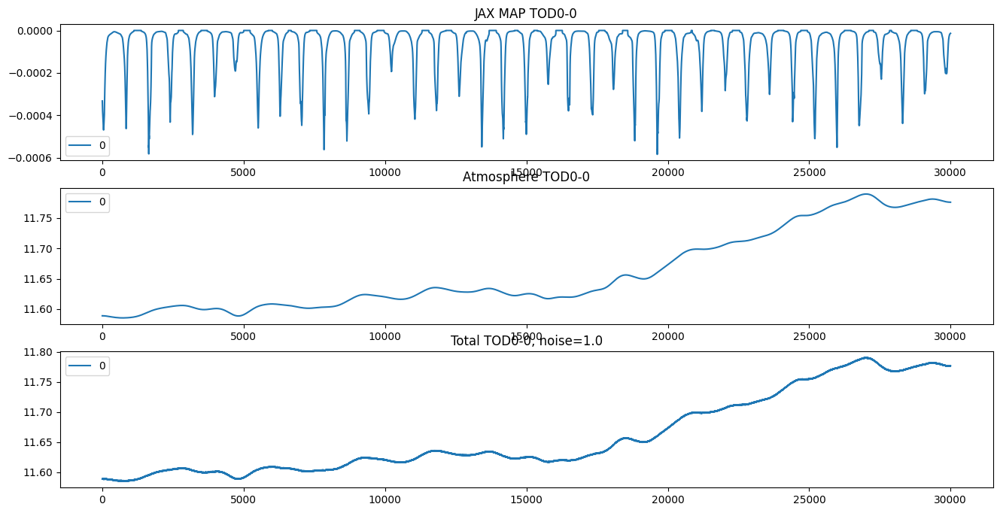

In [10]:
# Pick noise level for rest of run:
# noiselevel = 0.0
# noiselevel = 0.1
# noiselevel = 0.5
noiselevel = 1.0

# Add n TODs for atmos:
# n = 1
n = 10
# n = noised_jax_tod.shape[0]

jax_tods_atmos = tod_truthmap.components['atmosphere']
# noised_jax_tod = np.float64(jax_tods_map) + np.float64(jax_tods_atmos) + np.float64(tod_truthmap.components['noise']*noiselevel)

noised_jax_tod = np.float64(jax_tods_map) + np.float64(tod_truthmap.components['noise']*noiselevel)
noised_jax_tod[:n] += np.float64(jax_tods_atmos_smooth[:n]) 
# noised_jax_tod[:n] = np.float64(jax_tods_atmos_smooth[:n])

denoised_jax_tod = noised_jax_tod - np.float64(tod_truthmap.components['noise']*noiselevel)

print("Noise stddev:", np.std(tod_truthmap.components['noise'].compute()))

fig, axes = plt.subplots(3, 1, figsize=(16, 8))

# for i in [0, 10, 100, 200]:
for i in [0]:
    im0 = axes[0].plot(jax_tods_map[i], label=i)
    # im1 = axes[1].plot(jax_tods_atmos[i], label=i)
    im1 = axes[1].plot(jax_tods_atmos_smooth[i], label=i)
    im2 = axes[2].plot(noised_jax_tod[i], label=i)
    
axes[0].title.set_text(f'JAX MAP TOD0-{i}')
axes[0].legend()
axes[1].title.set_text(f'Atmosphere TOD0-{i}')
axes[1].legend()
axes[2].title.set_text(f'Total TOD0-{i}, noise={noiselevel}')
axes[2].legend()

plt.show()

# Next, initialise nifty prior model

Start with the atmosphere TOD model:

In [11]:
dims_atmos = (jax_tods_atmos.shape[1] + 2000,)
padding_atmos = dims_atmos[0] - jax_tods_atmos.shape[1]

# correlated field zero mode GP offset and stddev
# cf_zm_tod = dict(offset_mean=jax_tods_atmos.mean().compute(), offset_std=(0.001, 0.1))
cf_zm_tod = dict(offset_mean=jax_tods_atmos.mean().compute(), offset_std=(0.0005, 0.001))

# correlated field fluctuations (mostly don't need tuning)
# fluctuations: y-offset in power spectrum in fourier space (zero mode)
# loglogavgslope: power-spectrum slope in log-log space in frequency domain (Fourier space) Jakob: -4 -- -2
# flexibility=(1.5e0, 5e-1), # deviation from simple power-law
# asperity=(5e-1, 5e-2), # small scale features in power-law
cf_fl_tod = dict(
    # fluctuations=(0.005, 0.005), 
    fluctuations=(0.005, 0.003), 
    loglogavgslope=(-3, 0.5), 
    flexibility=None,
    asperity=None,
)

# put together in correlated field model
cfm_tod = jft.CorrelatedFieldMaker("")
cfm_tod.set_amplitude_total_offset(**cf_zm_tod)
cfm_tod.add_fluctuations(
    dims_atmos, distances=1.0 / dims_atmos[0], **cf_fl_tod, prefix="tod ", non_parametric_kind="power"
)
# gp_tod = cfm_tod.finalize()

## Add one Correlated field per TOD with shared flucts and zero-mean

In [12]:
# init params for each TOD:

gps_tods = []
for i in range(n):
    cfmi = jft.CorrelatedFieldMaker(f'tod{i} ')
    # cfmi.set_amplitude_total_offset(**cf_zm_tod)
    cfmi._azm = cfm_tod._azm
    cfmi._offset_mean = cfm_tod._offset_mean
    cfmi._parameter_tree['zeromode'] = jft.ShapeWithDtype(())

    cfmi._fluctuations.append(cfm_tod._fluctuations[0])
    cfmi._target_grids.append(cfm_tod._target_grids[0])
    cfmi._parameter_tree.update(cfm_tod._fluctuations[0].domain)
    gps_tods.append(cfmi.finalize())

## Now for the map model:

In [13]:
dims_map = (1000, 1000)

# Map model

# correlated field zero mode GP offset and stddev
# cf_zm_map = dict(offset_mean=mapdata_truth.mean(), offset_std=(1e-7, 1e-6))
cf_zm_map = dict(offset_mean=mapdata_truth.mean(), offset_std=(1e-8, 1e-7))
# correlated field fluctuations (mostly don't need tuning)
cf_fl_map = dict(
    # fluctuations=(1e-6, 1e-6), # fluctuations: y-offset in power spectrum in fourier space (zero mode)
    fluctuations=(2e-6, 1e-6), # fluctuations: y-offset in power spectrum in fourier space (zero mode)
    loglogavgslope=(-2.5e0, 5e-1), # power-spectrum slope in log-log space in frequency domain (Fourier space) Jakob: -4 -- -2
    flexibility=None,
    asperity=None,
    # flexibility=(1.5e0, 5e-1), # deviation from simple power-law
    # asperity=(5e-1, 5e-2), # small scale features in power-law
)

# put together in correlated field model
cfm_map = jft.CorrelatedFieldMaker("cfmap")
cfm_map.set_amplitude_total_offset(**cf_zm_map)
cfm_map.add_fluctuations(
    dims_map, distances=1.0 / dims_map[0], **cf_fl_map, prefix="ax1", non_parametric_kind="power"
)
gp_map = cfm_map.finalize()

In [14]:
# only tod:
# class Signal_TOD(jft.Model):
#     def __init__(self, gps_tods):
#         # self.gp_tod = gp_tod
#         # super().__init__(init=self.gp_tod.init, domain=jft.Vector(gp_tod.domain))
#         self.gps_tods = gps_tods
#         self.tgt = (len(gps_tods), gps_tods[0].target.size)
#         # self.gp_map = gp_map
#         # super().__init__(init=reduce(or_, [gp.init for gp in gps_tods] + [gp_map.init]), domain=reduce(or_, [gp.domain for gp in gps_tods] + [gp_map.domain]))
#         super().__init__(init=reduce(or_, [gp.init for gp in gps_tods]), domain=reduce(or_, [gp.domain for gp in gps_tods]))
    
#     def __call__(self, x):
#         res_tods = jnp.zeros(self.tgt)
#         for i, gp in enumerate(self.gps_tods):
#             res_tods = res_tods.at[i].set(gp(x))
        
#         return res_tods[:, padding_atmos//2:-padding_atmos//2]

#         # res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims_map[0], dims_map[1])), dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)

#         # # Only add first n atmosphere tods, otherwise use map
#         # modified_res_map = res_map.at[:n, :].add(res_tods[:, padding_atmos//2:-padding_atmos//2])

#         # return modified_res_map

# signal_response_tod = Signal_TOD(gps_tods)

# # map only:
# class Signal_TOD(jft.Model):
#     def __init__(self, gp_map):
#         # self.gp_tod = gp_tod
#         # super().__init__(init=self.gp_tod.init, domain=jft.Vector(gp_tod.domain))
#         # self.gps_tods = gps_tods
#         # self.tgt = (len(gps_tods), gps_tods[0].target.size)
#         self.gp_map = gp_map
#         # super().__init__(init=reduce(or_, [gp.init for gp in gps_tods] + [gp_map.init]), domain=reduce(or_, [gp.domain for gp in gps_tods] + [gp_map.domain]))
#         super().__init__(init=gp_map.init, domain=gp_map.domain)
    
#     def __call__(self, x):
#         # res_tods = jnp.zeros(self.tgt)
#         # for i, gp in enumerate(self.gps_tods):
#         #     res_tods = res_tods.at[i].set(gp(x))
        
#         res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims_map[0], dims_map[1])), dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)
#         return res_map

#         # Only add first n atmosphere tods, otherwise use map
#         # modified_res_map = res_map.at[:n, :].add(res_tods[:, padding_atmos//2:-padding_atmos//2])

#         # return modified_res_map
#         # return res_tods[:, padding_atmos//2:-padding_atmos//2] + res_map
#         # return res_tods[:, padding_atmos//2:-padding_atmos//2] + res_map[:n]
  
# signal_response_tod = Signal_TOD(gp_map)

In [15]:
# Define simple signal model with added map sampling
class Signal_TOD(jft.Model):
    def __init__(self, gps_tods, gp_map):
        # self.gp_tod = gp_tod
        # super().__init__(init=self.gp_tod.init, domain=jft.Vector(gp_tod.domain))
        self.gps_tods = gps_tods
        self.tgt = (len(gps_tods), gps_tods[0].target.size)
        self.gp_map = gp_map
        super().__init__(init=reduce(or_, [gp.init for gp in gps_tods] + [gp_map.init]), domain=reduce(or_, [gp.domain for gp in gps_tods] + [gp_map.domain]))
    
    def __call__(self, x):
        res_tods = jnp.zeros(self.tgt)
        for i, gp in enumerate(self.gps_tods):
            res_tods = res_tods.at[i].set(gp(x))
        
        res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims_map[0], dims_map[1])), dx, dy, sim_truthmap.map.resolution, sim_truthmap.map.x_side, sim_truthmap.map.y_side)

        # Only add first n atmosphere tods, otherwise use map
        modified_res_map = res_map.at[:n, :].add(res_tods[:, padding_atmos//2:-padding_atmos//2])

        return modified_res_map
        # return res_tods[:, padding_atmos//2:-padding_atmos//2] + res_map
        # return res_tods[:, padding_atmos//2:-padding_atmos//2] + res_map[:n]

signal_response_tod = Signal_TOD(gps_tods, gp_map)

# Define noise covariance
# if noiselevel == 0.0: noise_cov_inv_tod = lambda x: 2.5e-4**-2 * x
if noiselevel == 0.0: noise_cov_inv_tod = lambda x: 1e-8**-2 * x
elif noiselevel == 0.1: noise_cov_inv_tod = lambda x: 1e-4**-2 * x
elif noiselevel == 0.5: noise_cov_inv_tod = lambda x: 1e-4**-2 * x
elif noiselevel == 1.0: noise_cov_inv_tod = lambda x: 2.5e-4**-2 * x

# Combine in likelihood - only fit 0th TOD for now!
# truth = noised_jax_tod[:n]
truth = noised_jax_tod
lh_tod = jft.Gaussian( truth, noise_cov_inv_tod).amend(signal_response_tod)

# lh = lh_tod + lh_map
# lh = lh_map
lh = lh_tod

# lh_map_grad = jax.grad(lh_map)
lh_tod_grad = jax.grad(lh_tod)

assuming a diagonal covariance matrix;
setting `std_inv` to `cov_inv(ones_like(data))**0.5`


In [16]:
signal_response_tod

Signal_TOD(
	<bound method Signal_TOD.__call__>,
	domain={'cfmapax1fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'cfmapax1loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'cfmapxi': ShapeWithDtype(shape=(1000, 1000), dtype=<class 'jax.numpy.float64'>),
	 'cfmapzeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'tod fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'tod loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'tod0 xi': ShapeWithDtype(shape=(32000,), dtype=<class 'jax.numpy.float64'>),
	 'tod1 xi': ShapeWithDtype(shape=(32000,), dtype=<class 'jax.numpy.float64'>),
	 'tod2 xi': ShapeWithDtype(shape=(32000,), dtype=<class 'jax.numpy.float64'>),
	 'tod3 xi': ShapeWithDtype(shape=(32000,), dtype=<class 'jax.numpy.float64'>),
	 'tod4 xi': ShapeWithDtype(shape=(32000,), dtype=<class 'jax.numpy.float64'>),
	 'tod5 xi': ShapeWithDtype(shape=(3

# Draw Prior sample

(217, 30000)


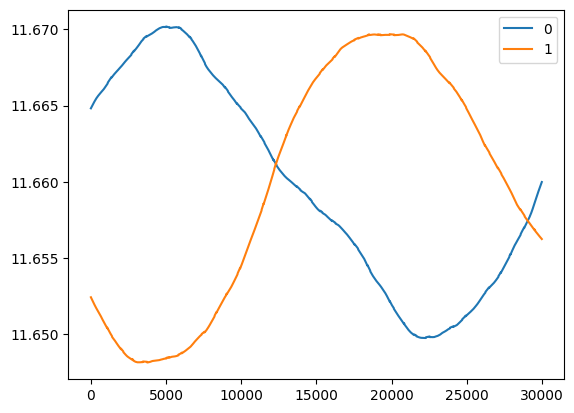

In [17]:
key, sub = jax.random.split(key)
xi = jft.random_like(sub, signal_response_tod.domain)
res = signal_response_tod(xi)
print(res.shape)

# for i in range(res.shape[0]):
for i in [0, 1]:
    plt.plot(np.arange(0, res.shape[1]), res[i], label=i)
plt.legend()
plt.show()

# MAP fit

In [18]:
n_it = 1
# delta = 1e-4 # default
# delta = 1e-8 # map
# tod
if noiselevel == 0.0: delta = 1e-4
elif noiselevel == 0.1: delta = 1e-10
elif noiselevel == 0.5: delta = 1e-10
elif noiselevel == 1.0: delta = 1e-4

n_samples = 0 # no samples -> maximum aposteriory posterior

key, k_i, k_o = random.split(key, 3)

samples, state = jft.optimize_kl(
    lh, # likelihood
    jft.Vector(lh.init(k_i)), # initial position in model space (initialisation)
    n_total_iterations=n_it, # no of optimisation steps (global)
    n_samples=n_samples, # draw samples
    key=k_o, # random jax init
    draw_linear_kwargs=dict( # sampling parameters
        cg_name="SL",
        cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=60),
    ),
    nonlinearly_update_kwargs=dict( # map from multivariate gaussian to more compl. distribution (coordinate transformations)
        minimize_kwargs=dict(
            name="SN",
            xtol=delta,
            cg_kwargs=dict(name=None),
            maxiter=5,
        )
    ),
    kl_kwargs=dict( # shift transformed multivar gauss to best match true posterior
        minimize_kwargs=dict(
            # name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=60 # map
            name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=20 # map
        )
    ),
    sample_mode="nonlinear_resample", # how steps are combined (samples + nonlin + KL)
)

OPTIMIZE_KL: Starting 0001
M: →:0.5 ↺:False #∇²:06 |↘|:9.838385e+02 ➽:1.320006e+02
M: Iteration 1 ⛰:+3.405730e+09 Δ⛰:6.664717e+09
M: →:1.0 ↺:False #∇²:12 |↘|:2.086074e+02 ➽:1.320006e+02
M: Iteration 2 ⛰:+9.183762e+08 Δ⛰:2.487354e+09
M: →:1.0 ↺:False #∇²:18 |↘|:5.241725e+02 ➽:1.320006e+02
M: Iteration 3 ⛰:+1.451755e+08 Δ⛰:7.732007e+08
M: →:1.0 ↺:False #∇²:24 |↘|:3.243198e+02 ➽:1.320006e+02
M: Iteration 4 ⛰:+8.112167e+07 Δ⛰:6.405383e+07
M: →:1.0 ↺:False #∇²:30 |↘|:2.206177e+02 ➽:1.320006e+02
M: Iteration 5 ⛰:+3.376428e+07 Δ⛰:4.735739e+07
M: →:1.0 ↺:False #∇²:36 |↘|:1.924353e+02 ➽:1.320006e+02
M: Iteration 6 ⛰:+2.369375e+07 Δ⛰:1.007053e+07
M: →:1.0 ↺:False #∇²:43 |↘|:1.683898e+02 ➽:1.320006e+02
M: Iteration 7 ⛰:+1.860050e+07 Δ⛰:5.093250e+06
M: →:1.0 ↺:False #∇²:51 |↘|:3.209883e+02 ➽:1.320006e+02
M: Iteration 8 ⛰:+1.362121e+07 Δ⛰:4.979294e+06
M: →:1.0 ↺:False #∇²:57 |↘|:7.384695e+01 ➽:1.320006e+02
M: Iteration 9 ⛰:+1.112284e+07 Δ⛰:2.498369e+06
OPTIMIZE_KL: Iteration 0001 ⛰:+1.1123e+07
OPTI

In [19]:
samples.pos

Vector(
	{'cfmapax1fluctuations': Array(-0.51302447, dtype=float64),
	 'cfmapax1loglogavgslope': Array(0.35229766, dtype=float64),
	 'cfmapxi': Array([[ 0.61232526, -2.06036481,  0.01526966, ...,  1.08119494,
	         0.27648367,  0.11361515],
	       [ 1.25571093, -0.7095167 ,  1.04755365, ..., -1.35426081,
	         1.54037492,  0.73396195],
	       [-0.23099742, -2.39755727, -1.47181511, ...,  0.17971488,
	         0.11483325, -0.02465751],
	       ...,
	       [ 1.37460572,  1.41352013,  1.7516173 , ..., -0.47706404,
	        -0.10545114,  0.8638471 ],
	       [-0.39815355,  1.30351547, -1.70467188, ...,  0.27437182,
	         1.53330362, -0.20375883],
	       [-2.05446069, -0.05074762, -1.23424944, ..., -2.00921842,
	         1.33477678,  1.78387914]], dtype=float64),
	 'cfmapzeromode': Array(-0.30881975, dtype=float64),
	 'tod fluctuations': Array(0.73846024, dtype=float64),
	 'tod loglogavgslope': Array(2.42391355, dtype=float64),
	 'tod0 xi': Array([  2.38993044,  15.06476869,

In [20]:
def printfitresults():
    print("Fit Results (res, init, std)")

    print("\nTODs:")
    print(f"\tfluctuations: {jft.LogNormalPrior(*cf_fl_tod['fluctuations'])(samples.pos['tod fluctuations'])}, {cf_fl_tod['fluctuations'][0]}, {cf_fl_tod['fluctuations'][1]}")
    print(f"\tloglogvarslope: {jft.NormalPrior(*cf_fl_tod['loglogavgslope'])(samples.pos['tod loglogavgslope'])}, {cf_fl_tod['loglogavgslope'][0]}, {cf_fl_tod['loglogavgslope'][1]}")
    print(f"\tzeromode std (LogNormal): {jft.LogNormalPrior(*cf_zm_tod['offset_std'])(samples.pos['zeromode'])}, {cf_zm_tod['offset_std'][0]}, {cf_zm_tod['offset_std'][1]}")

    # If custom zeromode per TOD:
    # for i in range(n):
    #     test = samples.pos[f"tod{i} zeromode"]
    #     print(f"tod{i} zeromode: {jft.LogNormalPrior(cf_zm_tod['offset_mean'], cf_zm_tod['offset_std'][0])(test)}, {cf_zm_tod['offset_mean']}, {cf_zm_tod['offset_std'][0]}")
    
    print("map:")
    print(f"\tfluctuations: {jft.LogNormalPrior(*cf_fl_map['fluctuations'])(samples.pos['cfmapax1fluctuations'])}, {cf_fl_map['fluctuations'][0]}, {cf_fl_map['fluctuations'][1]}")
    print(f"\tloglogvarslope: {jft.NormalPrior(*cf_fl_map['loglogavgslope'])(samples.pos['cfmapax1loglogavgslope'])}, {cf_fl_map['loglogavgslope'][0]}, {cf_fl_map['loglogavgslope'][1]}")
    print(f"\tzeromode std (LogNormal): {jft.LogNormalPrior(*cf_zm_map['offset_std'])(samples.pos['cfmapzeromode'])}, {cf_zm_map['offset_std'][0]}, {cf_zm_map['offset_std'][1]}")
    
    
printfitresults()

Fit Results (res, init, std)

TODs:
	fluctuations: 0.0064571070190697424, 0.005, 0.003
	loglogvarslope: -1.7880432241791273, -3, 0.5
	zeromode std (LogNormal): 0.000513588848641316, 0.0005, 0.001
map:
	fluctuations: 1.403869752279649e-06, 2e-06, 1e-06
	loglogvarslope: -2.3238511713399044, -2.5, 0.5
	zeromode std (LogNormal): 5.125241541666624e-10, 1e-08, 1e-07


(217, 30000)


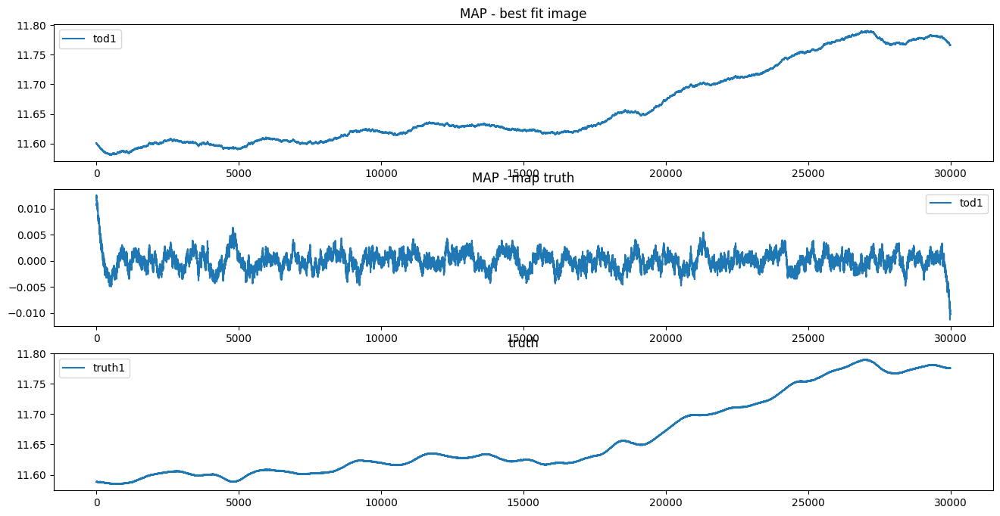

In [21]:
res = signal_response_tod(samples.pos)
print(res.shape)

fig, axes = plt.subplots(3, 1, figsize=(16, 8))

# for i in range(0, res.shape[0], res.shape[0]//10):
for i in [1]:
    im0 = axes[0].plot(np.arange(0, res.shape[1]), res[i], label=f"tod{i}")
    im1 = axes[1].plot(np.arange(0, res.shape[1]), res[i] - truth[i], label=f"tod{i}")
    im2 = axes[2].plot(truth[i], label=f"truth{i}")

axes[0].title.set_text('MAP - best fit image')
axes[0].legend()
axes[1].title.set_text('MAP - map truth')
axes[1].legend()
axes[2].title.set_text('truth')
axes[2].legend()

plt.show()

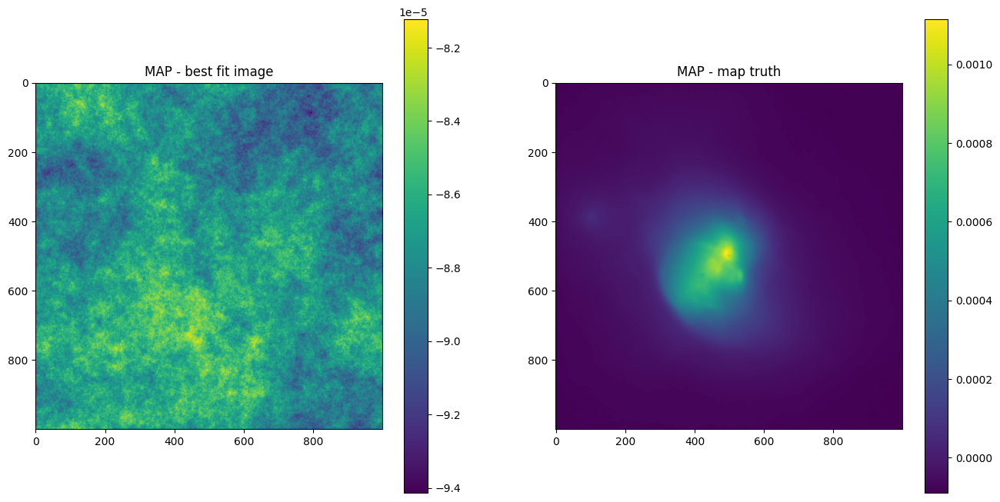

In [22]:
# plot maximum of posterior (mode)
sig_map = gp_map(samples.pos) # when splitting up in different field models

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

im0 = axes[0].imshow(sig_map)
axes[0].title.set_text('MAP - best fit image')
fig.colorbar(im0)

im1 = axes[1].imshow( sig_map - mapdata_truth[0] )
axes[1].title.set_text('MAP - map truth')
# im1 = axes[1].imshow( (sig_map - mapdata_truth) )
# axes[1].title.set_text('diff prediction - map truth')
fig.colorbar(im1)

plt.show()

In [23]:
# assert False

## Full nifty fit:

OPTIMIZE_KL: Starting 0001
SL: Iteration 0 ⛰:+9.2309e+07 Δ⛰:inf ➽:1.3200e+01
SL: Iteration 1 ⛰:+5.4663e+07 Δ⛰:3.7646e+07 ➽:1.3200e+01
SL: Iteration 2 ⛰:+1.3976e+07 Δ⛰:4.0687e+07 ➽:1.3200e+01
SL: Iteration 3 ⛰:+7.7923e+06 Δ⛰:6.1836e+06 ➽:1.3200e+01
SL: Iteration 4 ⛰:+5.0689e+06 Δ⛰:2.7234e+06 ➽:1.3200e+01
SL: Iteration 5 ⛰:+2.9367e+06 Δ⛰:2.1322e+06 ➽:1.3200e+01
SL: Iteration 6 ⛰:+2.1174e+06 Δ⛰:8.1926e+05 ➽:1.3200e+01
SL: Iteration 7 ⛰:+1.8170e+06 Δ⛰:3.0041e+05 ➽:1.3200e+01
SL: Iteration 8 ⛰:+1.3685e+06 Δ⛰:4.4855e+05 ➽:1.3200e+01
SL: Iteration 9 ⛰:+8.0630e+05 Δ⛰:5.6218e+05 ➽:1.3200e+01
SL: Iteration 10 ⛰:+7.9302e+05 Δ⛰:1.3276e+04 ➽:1.3200e+01
SL: Iteration 11 ⛰:+4.0021e+05 Δ⛰:3.9281e+05 ➽:1.3200e+01
SL: Iteration 12 ⛰:+3.6680e+05 Δ⛰:3.3413e+04 ➽:1.3200e+01
SL: Iteration 13 ⛰:+2.7484e+05 Δ⛰:9.1958e+04 ➽:1.3200e+01
SL: Iteration 14 ⛰:+2.4876e+05 Δ⛰:2.6081e+04 ➽:1.3200e+01
SL: Iteration 15 ⛰:+1.3375e+05 Δ⛰:1.1501e+05 ➽:1.3200e+01
SL: Iteration 16 ⛰:+1.9234e+04 Δ⛰:1.1452e+05 ➽:1.3200e+01
SL: 

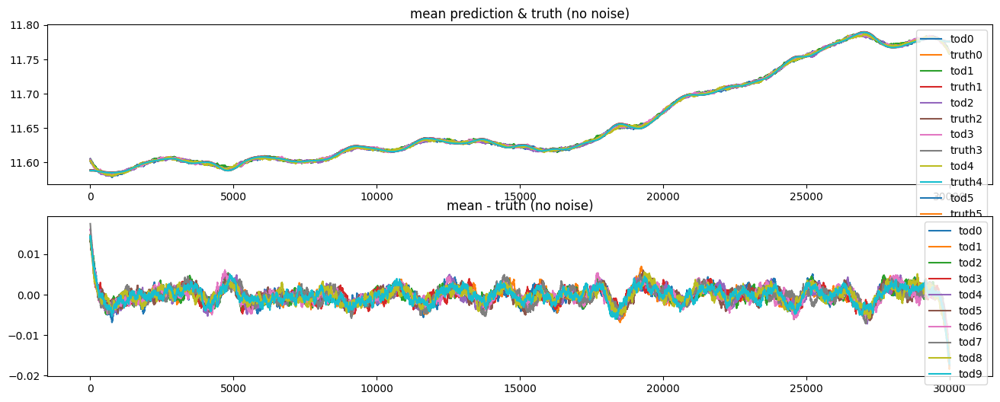

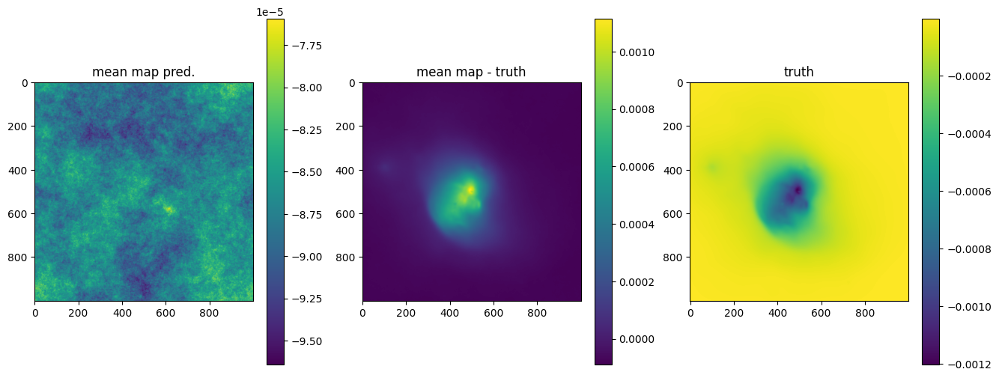

OPTIMIZE_KL: Starting 0002
SL: Iteration 0 ⛰:+5.8868e+08 Δ⛰:inf ➽:1.3200e+01
SL: Iteration 1 ⛰:+1.9592e+08 Δ⛰:3.9276e+08 ➽:1.3200e+01
SL: Iteration 2 ⛰:+6.7099e+07 Δ⛰:1.2882e+08 ➽:1.3200e+01
SL: Iteration 3 ⛰:+2.4624e+07 Δ⛰:4.2475e+07 ➽:1.3200e+01
SL: Iteration 4 ⛰:+1.9737e+07 Δ⛰:4.8865e+06 ➽:1.3200e+01
SL: Iteration 5 ⛰:+1.2481e+07 Δ⛰:7.2563e+06 ➽:1.3200e+01
SL: Iteration 6 ⛰:+1.2220e+07 Δ⛰:2.6090e+05 ➽:1.3200e+01
SL: Iteration 7 ⛰:+1.0596e+07 Δ⛰:1.6244e+06 ➽:1.3200e+01
SL: Iteration 8 ⛰:+6.8317e+06 Δ⛰:3.7641e+06 ➽:1.3200e+01
SL: Iteration 9 ⛰:+4.9070e+06 Δ⛰:1.9247e+06 ➽:1.3200e+01
SL: Iteration 10 ⛰:+4.8762e+06 Δ⛰:3.0849e+04 ➽:1.3200e+01
SL: Iteration 11 ⛰:+4.4656e+06 Δ⛰:4.1051e+05 ➽:1.3200e+01
SL: Iteration 12 ⛰:+4.4651e+06 Δ⛰:5.4848e+02 ➽:1.3200e+01
SL: Iteration 13 ⛰:+3.8240e+06 Δ⛰:6.4108e+05 ➽:1.3200e+01
SL: Iteration 14 ⛰:+2.7356e+06 Δ⛰:1.0885e+06 ➽:1.3200e+01
SL: Iteration 15 ⛰:+2.6441e+06 Δ⛰:9.1500e+04 ➽:1.3200e+01
SL: Iteration 16 ⛰:+2.1077e+06 Δ⛰:5.3634e+05 ➽:1.3200e+01
SL: 

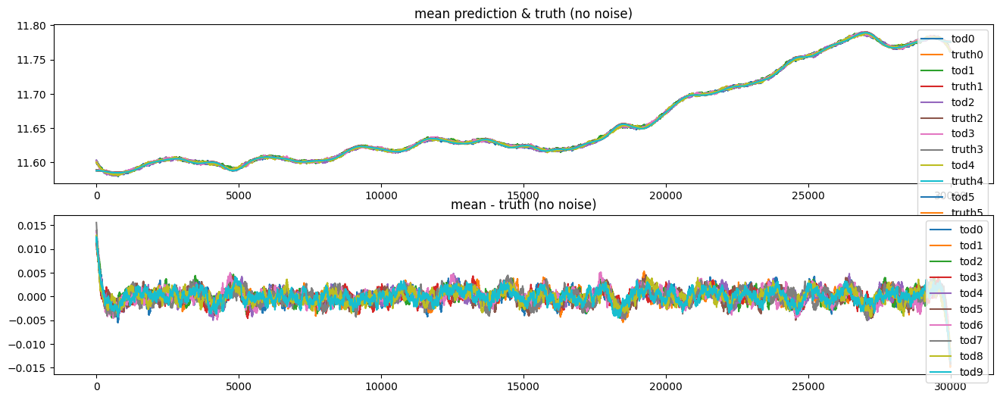

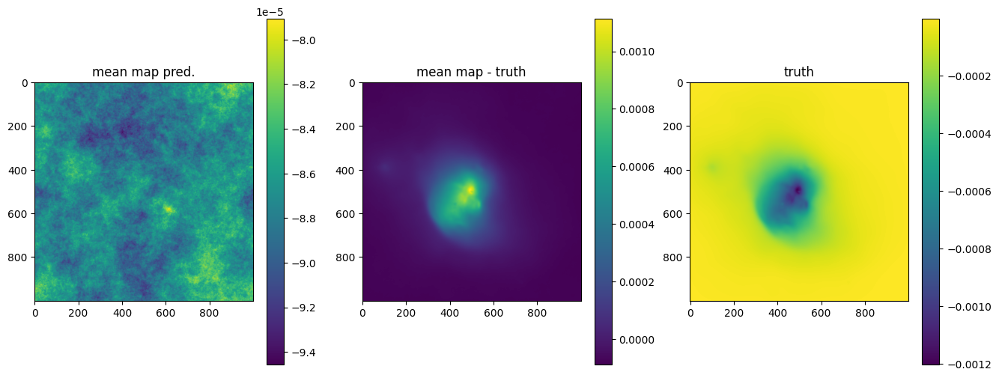

OPTIMIZE_KL: Starting 0003
SL: Iteration 0 ⛰:+9.4724e+08 Δ⛰:inf ➽:1.3200e+01
SL: Iteration 1 ⛰:+1.6271e+08 Δ⛰:7.8453e+08 ➽:1.3200e+01
SL: Iteration 2 ⛰:+9.8987e+07 Δ⛰:6.3727e+07 ➽:1.3200e+01
SL: Iteration 3 ⛰:+4.1340e+07 Δ⛰:5.7647e+07 ➽:1.3200e+01
SL: Iteration 4 ⛰:+2.5803e+07 Δ⛰:1.5537e+07 ➽:1.3200e+01
SL: Iteration 5 ⛰:+1.4057e+07 Δ⛰:1.1746e+07 ➽:1.3200e+01
SL: Iteration 6 ⛰:+1.1940e+07 Δ⛰:2.1170e+06 ➽:1.3200e+01
SL: Iteration 7 ⛰:+1.1761e+07 Δ⛰:1.7869e+05 ➽:1.3200e+01
SL: Iteration 8 ⛰:+7.6038e+06 Δ⛰:4.1575e+06 ➽:1.3200e+01
SL: Iteration 9 ⛰:+5.6577e+06 Δ⛰:1.9460e+06 ➽:1.3200e+01
SL: Iteration 10 ⛰:+5.6394e+06 Δ⛰:1.8337e+04 ➽:1.3200e+01
SL: Iteration 11 ⛰:+5.1031e+06 Δ⛰:5.3633e+05 ➽:1.3200e+01
SL: Iteration 12 ⛰:+5.1010e+06 Δ⛰:2.0838e+03 ➽:1.3200e+01
SL: Iteration 13 ⛰:+4.4359e+06 Δ⛰:6.6509e+05 ➽:1.3200e+01
SL: Iteration 14 ⛰:+3.1804e+06 Δ⛰:1.2555e+06 ➽:1.3200e+01
SL: Iteration 15 ⛰:+2.7974e+06 Δ⛰:3.8297e+05 ➽:1.3200e+01
SL: Iteration 16 ⛰:+2.4118e+06 Δ⛰:3.8558e+05 ➽:1.3200e+01
SL: 

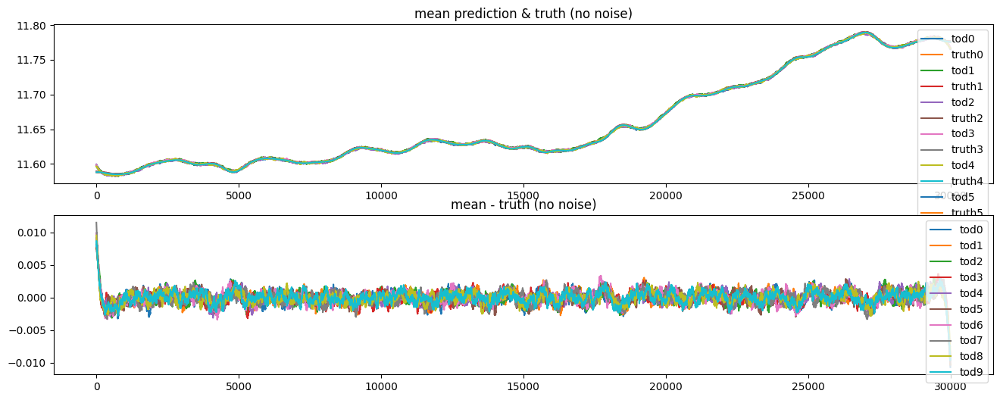

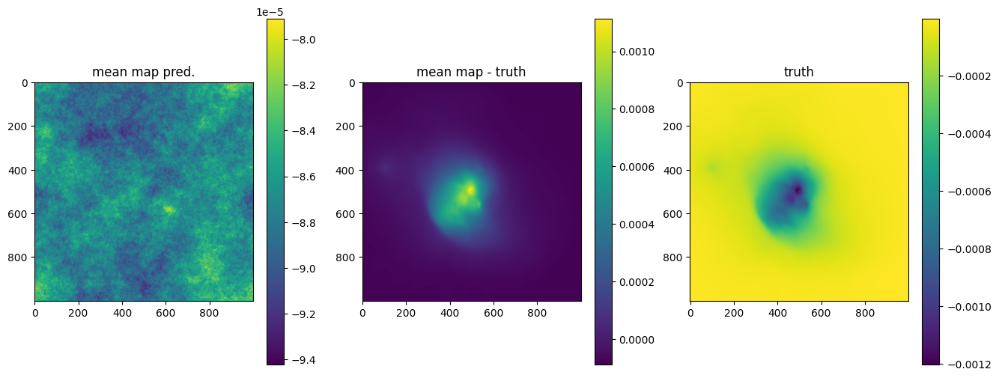

OPTIMIZE_KL: Starting 0004
SL: Iteration 0 ⛰:+1.2799e+09 Δ⛰:inf ➽:1.3200e+01
SL: Iteration 1 ⛰:+1.8439e+08 Δ⛰:1.0955e+09 ➽:1.3200e+01
SL: Iteration 2 ⛰:+1.1051e+08 Δ⛰:7.3879e+07 ➽:1.3200e+01
SL: Iteration 3 ⛰:+3.2687e+07 Δ⛰:7.7827e+07 ➽:1.3200e+01
SL: Iteration 4 ⛰:+2.5304e+07 Δ⛰:7.3827e+06 ➽:1.3200e+01
SL: Iteration 5 ⛰:+1.2463e+07 Δ⛰:1.2841e+07 ➽:1.3200e+01
SL: Iteration 6 ⛰:+1.0633e+07 Δ⛰:1.8297e+06 ➽:1.3200e+01
SL: Iteration 7 ⛰:+1.0620e+07 Δ⛰:1.2976e+04 ➽:1.3200e+01
SL: Iteration 8 ⛰:+6.1733e+06 Δ⛰:4.4468e+06 ➽:1.3200e+01
SL: Iteration 9 ⛰:+4.3010e+06 Δ⛰:1.8723e+06 ➽:1.3200e+01
SL: Iteration 10 ⛰:+3.5201e+06 Δ⛰:7.8089e+05 ➽:1.3200e+01
SL: Iteration 11 ⛰:+3.4133e+06 Δ⛰:1.0685e+05 ➽:1.3200e+01
SL: Iteration 12 ⛰:+3.3746e+06 Δ⛰:3.8697e+04 ➽:1.3200e+01
SL: Iteration 13 ⛰:+3.1259e+06 Δ⛰:2.4861e+05 ➽:1.3200e+01
SL: Iteration 14 ⛰:+2.1675e+06 Δ⛰:9.5846e+05 ➽:1.3200e+01
SL: Iteration 15 ⛰:+1.9949e+06 Δ⛰:1.7255e+05 ➽:1.3200e+01
SL: Iteration 16 ⛰:+1.6806e+06 Δ⛰:3.1430e+05 ➽:1.3200e+01
SL: 

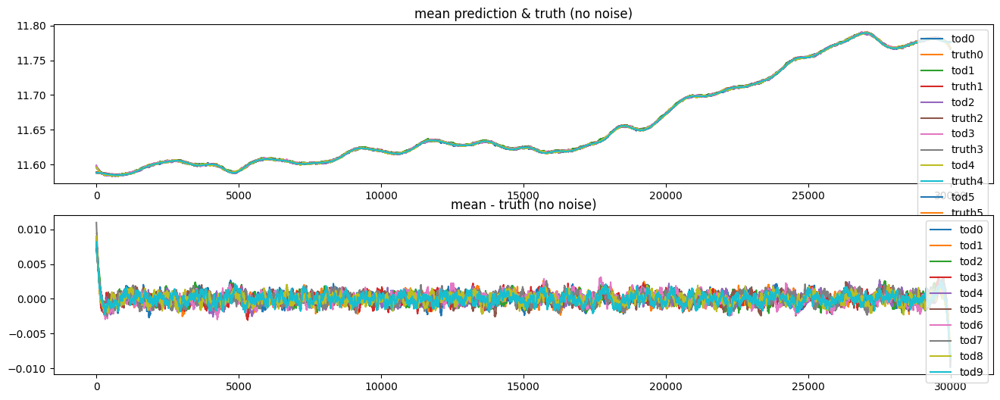

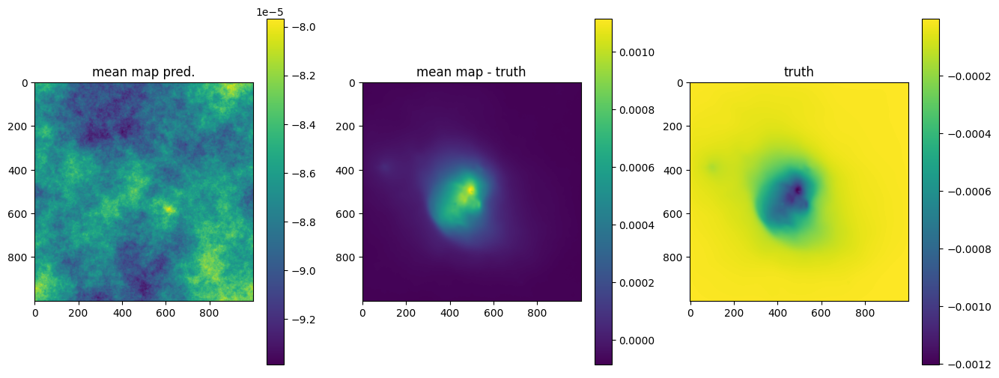

OPTIMIZE_KL: Starting 0005
SL: Iteration 0 ⛰:+4.5439e+08 Δ⛰:inf ➽:1.3200e+01
SL: Iteration 1 ⛰:+3.9603e+08 Δ⛰:5.8359e+07 ➽:1.3200e+01
SL: Iteration 2 ⛰:+8.8649e+07 Δ⛰:3.0739e+08 ➽:1.3200e+01
SL: Iteration 3 ⛰:+2.5002e+07 Δ⛰:6.3648e+07 ➽:1.3200e+01
SL: Iteration 4 ⛰:+1.7934e+07 Δ⛰:7.0677e+06 ➽:1.3200e+01
SL: Iteration 5 ⛰:+1.1984e+07 Δ⛰:5.9503e+06 ➽:1.3200e+01
SL: Iteration 6 ⛰:+9.8143e+06 Δ⛰:2.1692e+06 ➽:1.3200e+01
SL: Iteration 7 ⛰:+9.8024e+06 Δ⛰:1.1960e+04 ➽:1.3200e+01
SL: Iteration 8 ⛰:+5.5373e+06 Δ⛰:4.2651e+06 ➽:1.3200e+01
SL: Iteration 9 ⛰:+4.2781e+06 Δ⛰:1.2592e+06 ➽:1.3200e+01
SL: Iteration 10 ⛰:+3.9812e+06 Δ⛰:2.9694e+05 ➽:1.3200e+01
SL: Iteration 11 ⛰:+3.7659e+06 Δ⛰:2.1528e+05 ➽:1.3200e+01
SL: Iteration 12 ⛰:+3.1639e+06 Δ⛰:6.0199e+05 ➽:1.3200e+01
SL: Iteration 13 ⛰:+3.1624e+06 Δ⛰:1.4829e+03 ➽:1.3200e+01
SL: Iteration 14 ⛰:+2.3180e+06 Δ⛰:8.4438e+05 ➽:1.3200e+01
SL: Iteration 15 ⛰:+2.2244e+06 Δ⛰:9.3620e+04 ➽:1.3200e+01
SL: Iteration 16 ⛰:+1.6999e+06 Δ⛰:5.2455e+05 ➽:1.3200e+01
SL: 

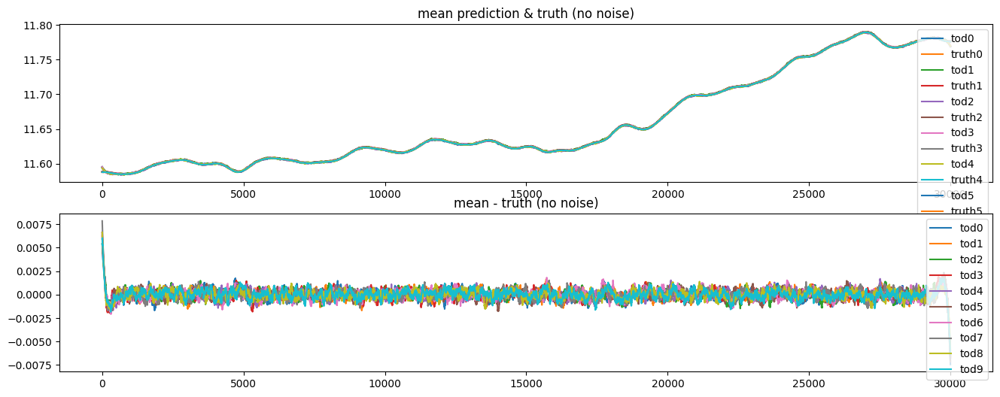

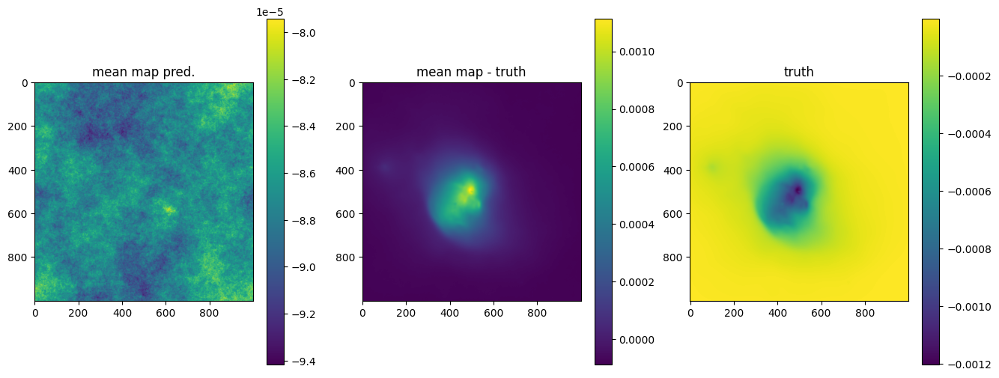

OPTIMIZE_KL: Starting 0006
SL: Iteration 0 ⛰:+1.2102e+08 Δ⛰:inf ➽:1.3200e+01
SL: Iteration 1 ⛰:+1.1784e+08 Δ⛰:3.1794e+06 ➽:1.3200e+01
SL: Iteration 2 ⛰:+1.0453e+08 Δ⛰:1.3311e+07 ➽:1.3200e+01
SL: Iteration 3 ⛰:+3.0789e+07 Δ⛰:7.3738e+07 ➽:1.3200e+01
SL: Iteration 4 ⛰:+1.9111e+07 Δ⛰:1.1678e+07 ➽:1.3200e+01
SL: Iteration 5 ⛰:+1.1570e+07 Δ⛰:7.5408e+06 ➽:1.3200e+01
SL: Iteration 6 ⛰:+9.8556e+06 Δ⛰:1.7146e+06 ➽:1.3200e+01
SL: Iteration 7 ⛰:+9.8532e+06 Δ⛰:2.3988e+03 ➽:1.3200e+01
SL: Iteration 8 ⛰:+5.1873e+06 Δ⛰:4.6659e+06 ➽:1.3200e+01
SL: Iteration 9 ⛰:+3.7467e+06 Δ⛰:1.4406e+06 ➽:1.3200e+01
SL: Iteration 10 ⛰:+3.3801e+06 Δ⛰:3.6655e+05 ➽:1.3200e+01
SL: Iteration 11 ⛰:+3.3247e+06 Δ⛰:5.5451e+04 ➽:1.3200e+01
SL: Iteration 12 ⛰:+2.6865e+06 Δ⛰:6.3824e+05 ➽:1.3200e+01
SL: Iteration 13 ⛰:+2.6788e+06 Δ⛰:7.6115e+03 ➽:1.3200e+01
SL: Iteration 14 ⛰:+1.8083e+06 Δ⛰:8.7056e+05 ➽:1.3200e+01
SL: Iteration 15 ⛰:+1.7179e+06 Δ⛰:9.0371e+04 ➽:1.3200e+01
SL: Iteration 16 ⛰:+1.5097e+06 Δ⛰:2.0825e+05 ➽:1.3200e+01
SL: 

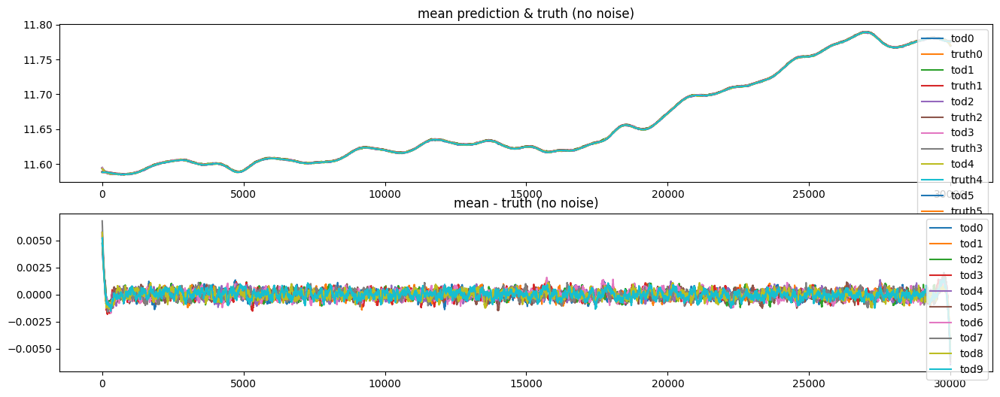

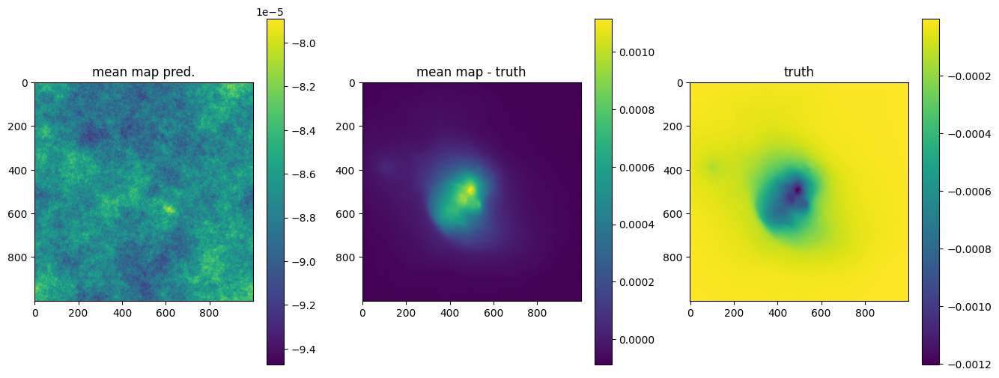

OPTIMIZE_KL: Starting 0007
SL: Iteration 0 ⛰:+1.5672e+09 Δ⛰:inf ➽:1.3200e+01
SL: Iteration 1 ⛰:+3.5457e+08 Δ⛰:1.2126e+09 ➽:1.3200e+01
SL: Iteration 2 ⛰:+1.3142e+08 Δ⛰:2.2315e+08 ➽:1.3200e+01
SL: Iteration 3 ⛰:+2.1124e+07 Δ⛰:1.1030e+08 ➽:1.3200e+01
SL: Iteration 4 ⛰:+1.5181e+07 Δ⛰:5.9431e+06 ➽:1.3200e+01
SL: Iteration 5 ⛰:+1.0307e+07 Δ⛰:4.8740e+06 ➽:1.3200e+01
SL: Iteration 6 ⛰:+9.2003e+06 Δ⛰:1.1070e+06 ➽:1.3200e+01
SL: Iteration 7 ⛰:+8.8523e+06 Δ⛰:3.4798e+05 ➽:1.3200e+01
SL: Iteration 8 ⛰:+4.6405e+06 Δ⛰:4.2118e+06 ➽:1.3200e+01
SL: Iteration 9 ⛰:+3.5706e+06 Δ⛰:1.0699e+06 ➽:1.3200e+01
SL: Iteration 10 ⛰:+3.4138e+06 Δ⛰:1.5681e+05 ➽:1.3200e+01
SL: Iteration 11 ⛰:+3.2450e+06 Δ⛰:1.6881e+05 ➽:1.3200e+01
SL: Iteration 12 ⛰:+3.2269e+06 Δ⛰:1.8103e+04 ➽:1.3200e+01
SL: Iteration 13 ⛰:+2.4452e+06 Δ⛰:7.8177e+05 ➽:1.3200e+01
SL: Iteration 14 ⛰:+1.4736e+06 Δ⛰:9.7157e+05 ➽:1.3200e+01
SL: Iteration 15 ⛰:+1.3877e+06 Δ⛰:8.5839e+04 ➽:1.3200e+01
SL: Iteration 16 ⛰:+1.1303e+06 Δ⛰:2.5744e+05 ➽:1.3200e+01
SL: 

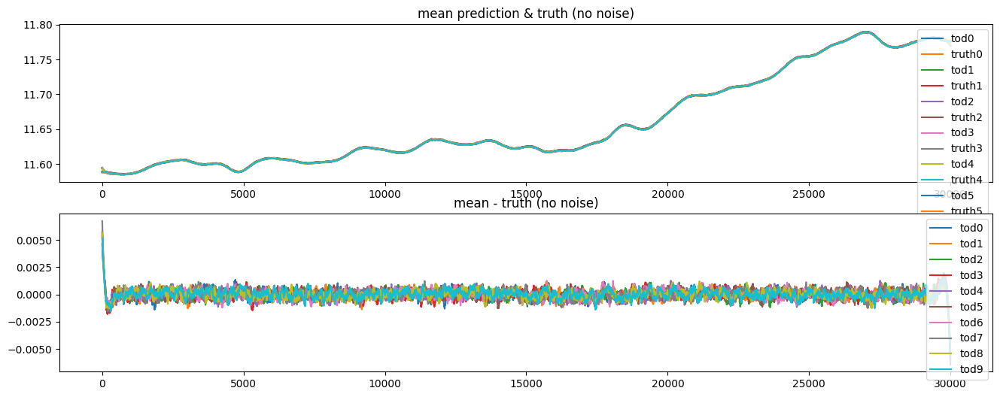

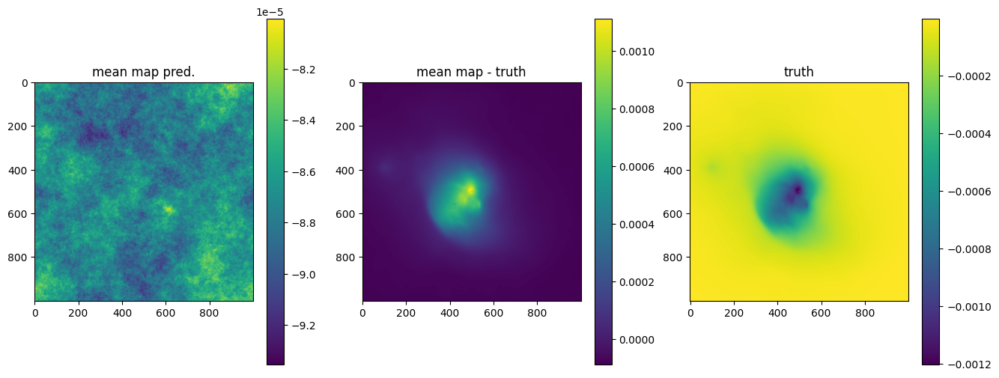

OPTIMIZE_KL: Starting 0008
SL: Iteration 0 ⛰:+2.6361e+09 Δ⛰:inf ➽:1.3200e+01
SL: Iteration 1 ⛰:+4.1779e+08 Δ⛰:2.2183e+09 ➽:1.3200e+01
SL: Iteration 2 ⛰:+1.0866e+08 Δ⛰:3.0913e+08 ➽:1.3200e+01
SL: Iteration 3 ⛰:+3.2134e+07 Δ⛰:7.6523e+07 ➽:1.3200e+01
SL: Iteration 4 ⛰:+2.3975e+07 Δ⛰:8.1593e+06 ➽:1.3200e+01
SL: Iteration 5 ⛰:+1.1340e+07 Δ⛰:1.2635e+07 ➽:1.3200e+01
SL: Iteration 6 ⛰:+1.0358e+07 Δ⛰:9.8230e+05 ➽:1.3200e+01
SL: Iteration 7 ⛰:+9.8102e+06 Δ⛰:5.4790e+05 ➽:1.3200e+01
SL: Iteration 8 ⛰:+5.0918e+06 Δ⛰:4.7184e+06 ➽:1.3200e+01
SL: Iteration 9 ⛰:+4.1208e+06 Δ⛰:9.7099e+05 ➽:1.3200e+01
SL: Iteration 10 ⛰:+3.7099e+06 Δ⛰:4.1088e+05 ➽:1.3200e+01
SL: Iteration 11 ⛰:+3.5573e+06 Δ⛰:1.5265e+05 ➽:1.3200e+01
SL: Iteration 12 ⛰:+3.3308e+06 Δ⛰:2.2647e+05 ➽:1.3200e+01
SL: Iteration 13 ⛰:+2.4207e+06 Δ⛰:9.1006e+05 ➽:1.3200e+01
SL: Iteration 14 ⛰:+1.9502e+06 Δ⛰:4.7056e+05 ➽:1.3200e+01
SL: Iteration 15 ⛰:+1.4779e+06 Δ⛰:4.7229e+05 ➽:1.3200e+01
SL: Iteration 16 ⛰:+1.2466e+06 Δ⛰:2.3126e+05 ➽:1.3200e+01
SL: 

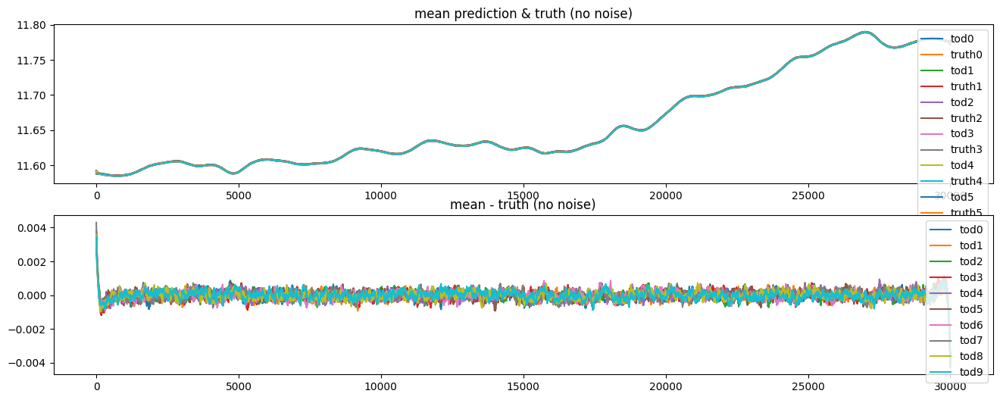

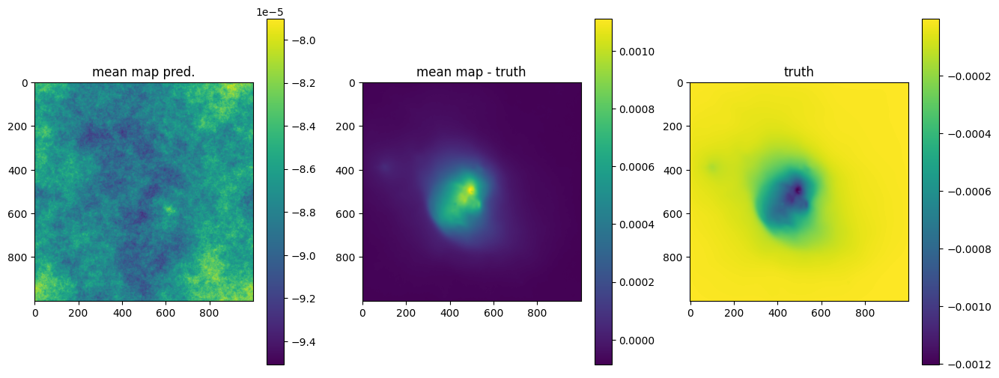

OPTIMIZE_KL: Starting 0009
SL: Iteration 0 ⛰:+1.3149e+10 Δ⛰:inf ➽:1.3200e+01
SL: Iteration 1 ⛰:+5.3431e+08 Δ⛰:1.2614e+10 ➽:1.3200e+01
SL: Iteration 2 ⛰:+1.0269e+08 Δ⛰:4.3162e+08 ➽:1.3200e+01
SL: Iteration 3 ⛰:+2.9022e+07 Δ⛰:7.3666e+07 ➽:1.3200e+01
SL: Iteration 4 ⛰:+1.8046e+07 Δ⛰:1.0975e+07 ➽:1.3200e+01
SL: Iteration 5 ⛰:+9.5937e+06 Δ⛰:8.4528e+06 ➽:1.3200e+01
SL: Iteration 6 ⛰:+8.4246e+06 Δ⛰:1.1691e+06 ➽:1.3200e+01
SL: Iteration 7 ⛰:+8.1942e+06 Δ⛰:2.3039e+05 ➽:1.3200e+01
SL: Iteration 8 ⛰:+3.8549e+06 Δ⛰:4.3393e+06 ➽:1.3200e+01
SL: Iteration 9 ⛰:+2.9283e+06 Δ⛰:9.2656e+05 ➽:1.3200e+01
SL: Iteration 10 ⛰:+2.6701e+06 Δ⛰:2.5825e+05 ➽:1.3200e+01
SL: Iteration 11 ⛰:+2.6209e+06 Δ⛰:4.9211e+04 ➽:1.3200e+01
SL: Iteration 12 ⛰:+2.5953e+06 Δ⛰:2.5579e+04 ➽:1.3200e+01
SL: Iteration 13 ⛰:+1.7280e+06 Δ⛰:8.6728e+05 ➽:1.3200e+01
SL: Iteration 14 ⛰:+1.3677e+06 Δ⛰:3.6030e+05 ➽:1.3200e+01
SL: Iteration 15 ⛰:+9.8094e+05 Δ⛰:3.8679e+05 ➽:1.3200e+01
SL: Iteration 16 ⛰:+7.7420e+05 Δ⛰:2.0673e+05 ➽:1.3200e+01
SL: 

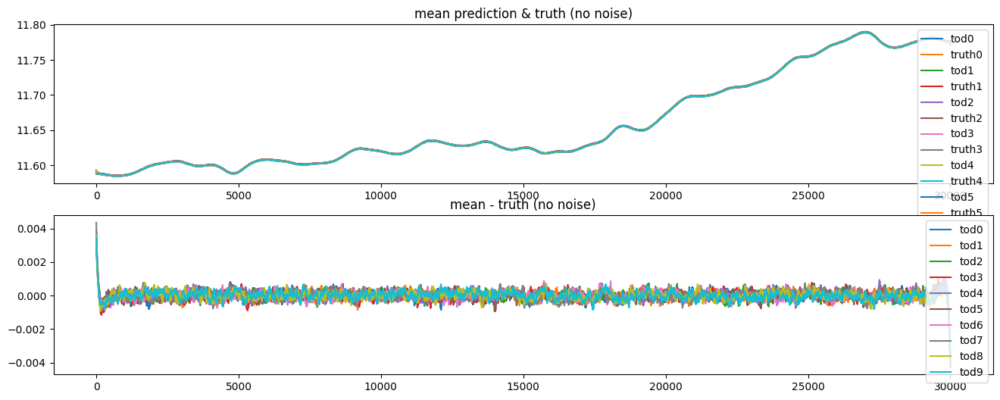

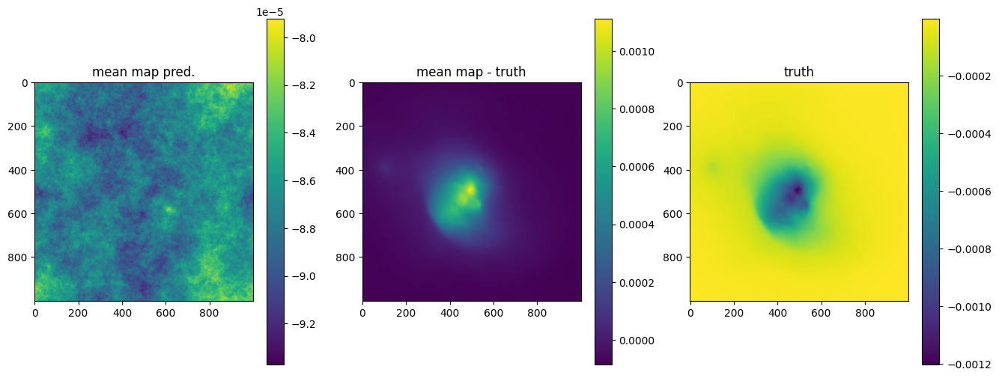

OPTIMIZE_KL: Starting 0010
SL: Iteration 0 ⛰:+2.8453e+09 Δ⛰:inf ➽:1.3200e+01
SL: Iteration 1 ⛰:+1.4801e+08 Δ⛰:2.6973e+09 ➽:1.3200e+01
SL: Iteration 2 ⛰:+1.1859e+08 Δ⛰:2.9416e+07 ➽:1.3200e+01
SL: Iteration 3 ⛰:+3.0174e+07 Δ⛰:8.8418e+07 ➽:1.3200e+01
SL: Iteration 4 ⛰:+1.7999e+07 Δ⛰:1.2176e+07 ➽:1.3200e+01
SL: Iteration 5 ⛰:+1.0209e+07 Δ⛰:7.7901e+06 ➽:1.3200e+01
SL: Iteration 6 ⛰:+9.2334e+06 Δ⛰:9.7534e+05 ➽:1.3200e+01
SL: Iteration 7 ⛰:+8.4083e+06 Δ⛰:8.2506e+05 ➽:1.3200e+01
SL: Iteration 8 ⛰:+4.0989e+06 Δ⛰:4.3094e+06 ➽:1.3200e+01
SL: Iteration 9 ⛰:+3.3429e+06 Δ⛰:7.5605e+05 ➽:1.3200e+01
SL: Iteration 10 ⛰:+2.8737e+06 Δ⛰:4.6914e+05 ➽:1.3200e+01
SL: Iteration 11 ⛰:+2.8636e+06 Δ⛰:1.0161e+04 ➽:1.3200e+01
SL: Iteration 12 ⛰:+2.8585e+06 Δ⛰:5.0878e+03 ➽:1.3200e+01
SL: Iteration 13 ⛰:+1.6629e+06 Δ⛰:1.1956e+06 ➽:1.3200e+01
SL: Iteration 14 ⛰:+1.4994e+06 Δ⛰:1.6346e+05 ➽:1.3200e+01
SL: Iteration 15 ⛰:+9.6909e+05 Δ⛰:5.3034e+05 ➽:1.3200e+01
SL: Iteration 16 ⛰:+7.0249e+05 Δ⛰:2.6660e+05 ➽:1.3200e+01
SL: 

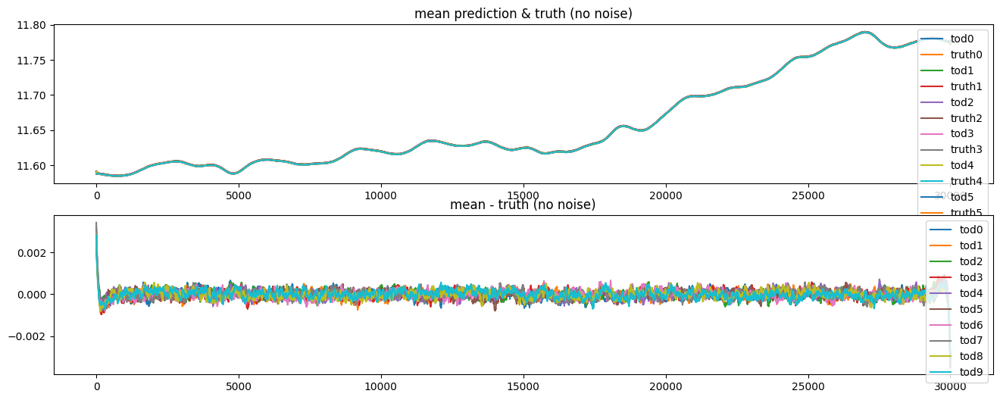

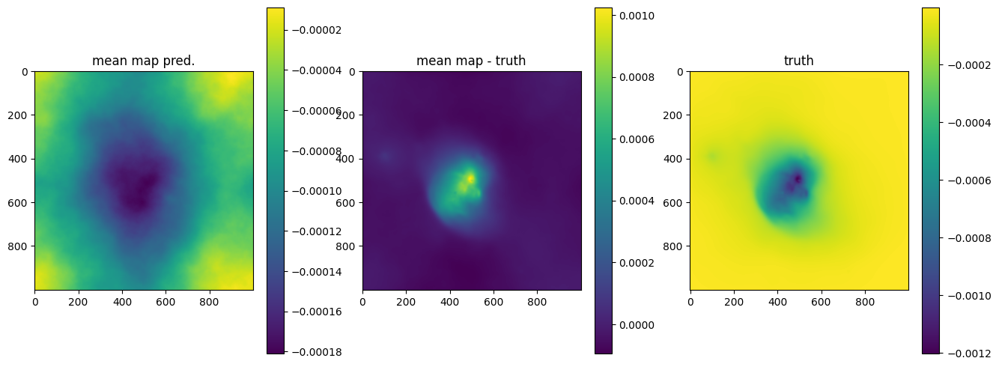

OPTIMIZE_KL: Starting 0011
SL: Iteration 0 ⛰:+3.9185e+08 Δ⛰:inf ➽:1.3200e+01
SL: Iteration 1 ⛰:+8.5131e+07 Δ⛰:3.0672e+08 ➽:1.3200e+01
SL: Iteration 2 ⛰:+7.7146e+07 Δ⛰:7.9847e+06 ➽:1.3200e+01
SL: Iteration 3 ⛰:+1.7807e+07 Δ⛰:5.9339e+07 ➽:1.3200e+01
SL: Iteration 4 ⛰:+1.3783e+07 Δ⛰:4.0240e+06 ➽:1.3200e+01
SL: Iteration 5 ⛰:+6.5544e+06 Δ⛰:7.2286e+06 ➽:1.3200e+01
SL: Iteration 6 ⛰:+5.2644e+06 Δ⛰:1.2900e+06 ➽:1.3200e+01
SL: Iteration 7 ⛰:+5.2550e+06 Δ⛰:9.4372e+03 ➽:1.3200e+01
SL: Iteration 8 ⛰:+2.5253e+06 Δ⛰:2.7296e+06 ➽:1.3200e+01
SL: Iteration 9 ⛰:+1.9779e+06 Δ⛰:5.4746e+05 ➽:1.3200e+01
SL: Iteration 10 ⛰:+1.7307e+06 Δ⛰:2.4718e+05 ➽:1.3200e+01
SL: Iteration 11 ⛰:+1.6813e+06 Δ⛰:4.9374e+04 ➽:1.3200e+01
SL: Iteration 12 ⛰:+1.3250e+06 Δ⛰:3.5630e+05 ➽:1.3200e+01
SL: Iteration 13 ⛰:+1.0554e+06 Δ⛰:2.6967e+05 ➽:1.3200e+01
SL: Iteration 14 ⛰:+7.0855e+05 Δ⛰:3.4681e+05 ➽:1.3200e+01
SL: Iteration 15 ⛰:+5.0321e+05 Δ⛰:2.0534e+05 ➽:1.3200e+01
SL: Iteration 16 ⛰:+3.4214e+05 Δ⛰:1.6107e+05 ➽:1.3200e+01
SL: 

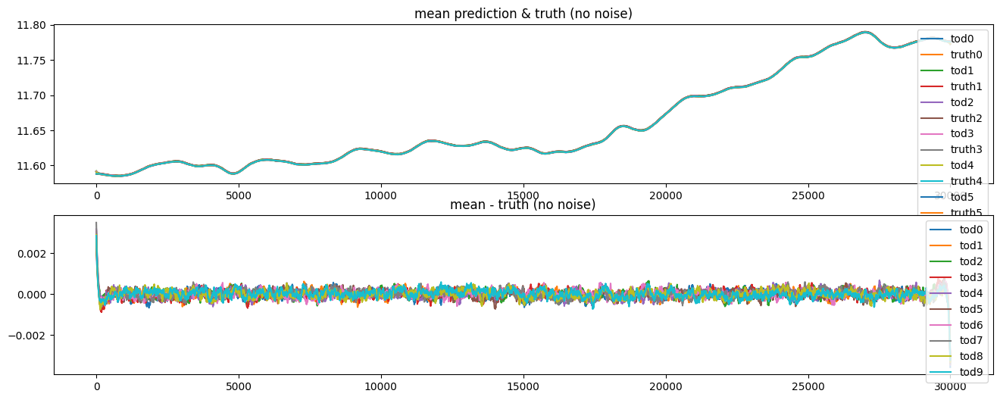

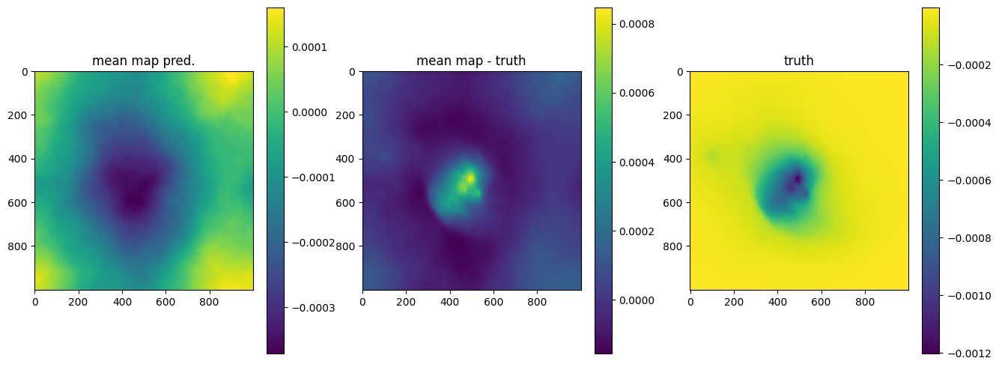

OPTIMIZE_KL: Starting 0012
SL: Iteration 0 ⛰:+1.5964e+09 Δ⛰:inf ➽:1.3200e+01
SL: Iteration 1 ⛰:+2.8005e+08 Δ⛰:1.3164e+09 ➽:1.3200e+01
SL: Iteration 2 ⛰:+9.2487e+07 Δ⛰:1.8756e+08 ➽:1.3200e+01
SL: Iteration 3 ⛰:+1.5297e+07 Δ⛰:7.7189e+07 ➽:1.3200e+01
SL: Iteration 4 ⛰:+1.2335e+07 Δ⛰:2.9626e+06 ➽:1.3200e+01
SL: Iteration 5 ⛰:+6.8402e+06 Δ⛰:5.4947e+06 ➽:1.3200e+01
SL: Iteration 6 ⛰:+5.6170e+06 Δ⛰:1.2232e+06 ➽:1.3200e+01
SL: Iteration 7 ⛰:+5.3844e+06 Δ⛰:2.3261e+05 ➽:1.3200e+01
SL: Iteration 8 ⛰:+2.7396e+06 Δ⛰:2.6448e+06 ➽:1.3200e+01
SL: Iteration 9 ⛰:+2.0472e+06 Δ⛰:6.9236e+05 ➽:1.3200e+01
SL: Iteration 10 ⛰:+1.9936e+06 Δ⛰:5.3597e+04 ➽:1.3200e+01
SL: Iteration 11 ⛰:+1.7742e+06 Δ⛰:2.1944e+05 ➽:1.3200e+01
SL: Iteration 12 ⛰:+1.7231e+06 Δ⛰:5.1065e+04 ➽:1.3200e+01
SL: Iteration 13 ⛰:+1.0298e+06 Δ⛰:6.9327e+05 ➽:1.3200e+01
SL: Iteration 14 ⛰:+6.9308e+05 Δ⛰:3.3674e+05 ➽:1.3200e+01
SL: Iteration 15 ⛰:+5.5023e+05 Δ⛰:1.4284e+05 ➽:1.3200e+01
SL: Iteration 16 ⛰:+3.3418e+05 Δ⛰:2.1606e+05 ➽:1.3200e+01
SL: 

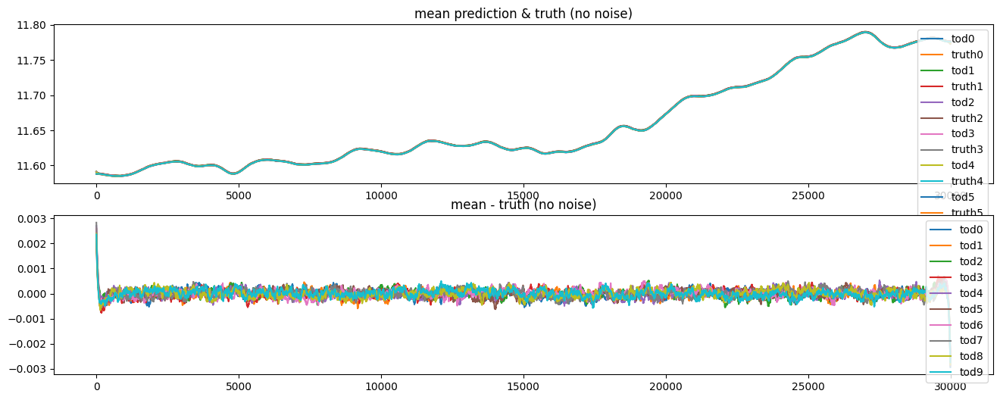

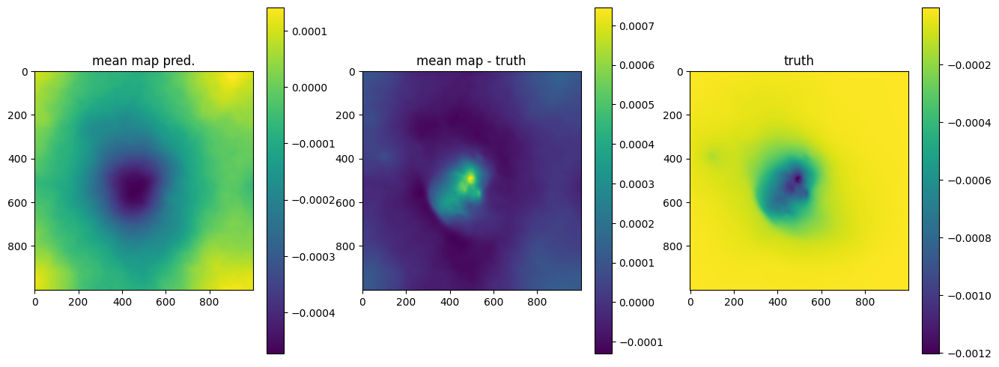

OPTIMIZE_KL: Starting 0013
SL: Iteration 0 ⛰:+1.6190e+09 Δ⛰:inf ➽:1.3200e+01
SL: Iteration 1 ⛰:+1.9439e+08 Δ⛰:1.4246e+09 ➽:1.3200e+01
SL: Iteration 2 ⛰:+1.4787e+08 Δ⛰:4.6522e+07 ➽:1.3200e+01
SL: Iteration 3 ⛰:+1.8074e+07 Δ⛰:1.2979e+08 ➽:1.3200e+01
SL: Iteration 4 ⛰:+1.3476e+07 Δ⛰:4.5981e+06 ➽:1.3200e+01
SL: Iteration 5 ⛰:+7.4491e+06 Δ⛰:6.0269e+06 ➽:1.3200e+01
SL: Iteration 6 ⛰:+5.0848e+06 Δ⛰:2.3643e+06 ➽:1.3200e+01
SL: Iteration 7 ⛰:+4.9866e+06 Δ⛰:9.8215e+04 ➽:1.3200e+01
SL: Iteration 8 ⛰:+2.2363e+06 Δ⛰:2.7502e+06 ➽:1.3200e+01
SL: Iteration 9 ⛰:+1.9092e+06 Δ⛰:3.2712e+05 ➽:1.3200e+01
SL: Iteration 10 ⛰:+1.4906e+06 Δ⛰:4.1864e+05 ➽:1.3200e+01
SL: Iteration 11 ⛰:+1.4604e+06 Δ⛰:3.0157e+04 ➽:1.3200e+01
SL: Iteration 12 ⛰:+1.4579e+06 Δ⛰:2.5477e+03 ➽:1.3200e+01
SL: Iteration 13 ⛰:+7.1073e+05 Δ⛰:7.4713e+05 ➽:1.3200e+01
SL: Iteration 14 ⛰:+6.6974e+05 Δ⛰:4.0988e+04 ➽:1.3200e+01
SL: Iteration 15 ⛰:+2.7554e+05 Δ⛰:3.9420e+05 ➽:1.3200e+01
SL: Iteration 16 ⛰:+1.6958e+05 Δ⛰:1.0596e+05 ➽:1.3200e+01
SL: 

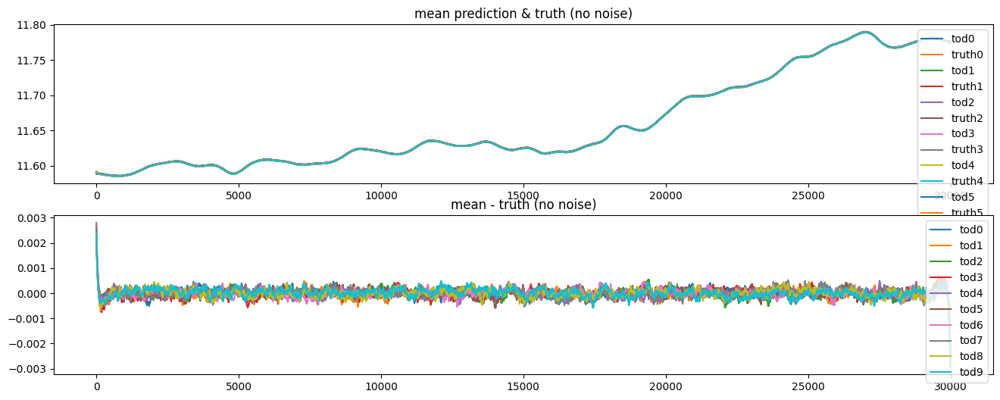

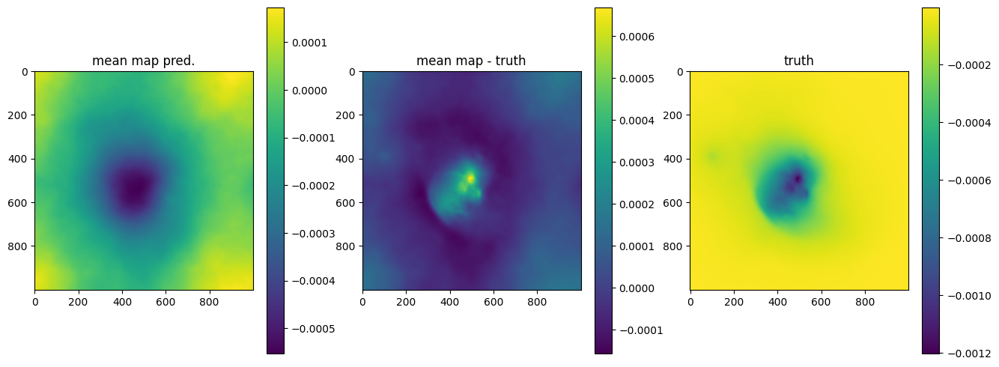

OPTIMIZE_KL: Starting 0014
SL: Iteration 0 ⛰:+3.3758e+08 Δ⛰:inf ➽:1.3200e+01
SL: Iteration 1 ⛰:+1.7136e+08 Δ⛰:1.6622e+08 ➽:1.3200e+01
SL: Iteration 2 ⛰:+9.1402e+07 Δ⛰:7.9959e+07 ➽:1.3200e+01
SL: Iteration 3 ⛰:+1.5849e+07 Δ⛰:7.5553e+07 ➽:1.3200e+01
SL: Iteration 4 ⛰:+1.2390e+07 Δ⛰:3.4593e+06 ➽:1.3200e+01
SL: Iteration 5 ⛰:+6.0134e+06 Δ⛰:6.3762e+06 ➽:1.3200e+01
SL: Iteration 6 ⛰:+4.4657e+06 Δ⛰:1.5478e+06 ➽:1.3200e+01
SL: Iteration 7 ⛰:+4.4496e+06 Δ⛰:1.6021e+04 ➽:1.3200e+01
SL: Iteration 8 ⛰:+2.3346e+06 Δ⛰:2.1150e+06 ➽:1.3200e+01
SL: Iteration 9 ⛰:+2.0542e+06 Δ⛰:2.8047e+05 ➽:1.3200e+01
SL: Iteration 10 ⛰:+1.6714e+06 Δ⛰:3.8282e+05 ➽:1.3200e+01
SL: Iteration 11 ⛰:+1.6316e+06 Δ⛰:3.9769e+04 ➽:1.3200e+01
SL: Iteration 12 ⛰:+9.0495e+05 Δ⛰:7.2663e+05 ➽:1.3200e+01
SL: Iteration 13 ⛰:+8.8244e+05 Δ⛰:2.2507e+04 ➽:1.3200e+01
SL: Iteration 14 ⛰:+8.3576e+05 Δ⛰:4.6689e+04 ➽:1.3200e+01
SL: Iteration 15 ⛰:+4.5535e+05 Δ⛰:3.8041e+05 ➽:1.3200e+01
SL: Iteration 16 ⛰:+3.4698e+05 Δ⛰:1.0836e+05 ➽:1.3200e+01
SL: 

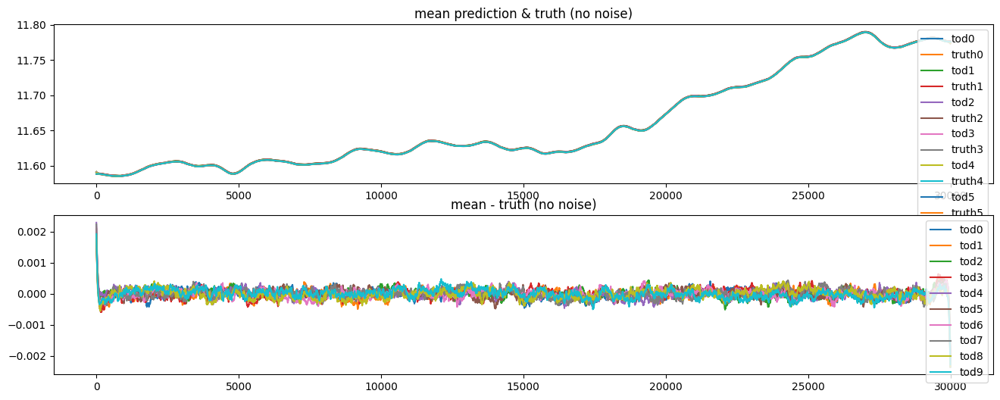

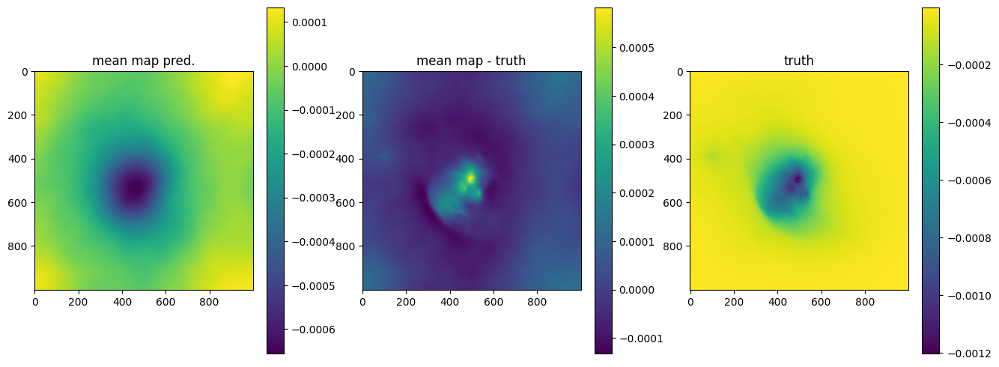

OPTIMIZE_KL: Starting 0015
SL: Iteration 0 ⛰:+2.2311e+09 Δ⛰:inf ➽:1.3200e+01
SL: Iteration 1 ⛰:+1.0287e+08 Δ⛰:2.1283e+09 ➽:1.3200e+01
SL: Iteration 2 ⛰:+9.3781e+07 Δ⛰:9.0914e+06 ➽:1.3200e+01
SL: Iteration 3 ⛰:+1.8485e+07 Δ⛰:7.5296e+07 ➽:1.3200e+01
SL: Iteration 4 ⛰:+1.3737e+07 Δ⛰:4.7471e+06 ➽:1.3200e+01
SL: Iteration 5 ⛰:+7.4301e+06 Δ⛰:6.3073e+06 ➽:1.3200e+01
SL: Iteration 6 ⛰:+5.3552e+06 Δ⛰:2.0749e+06 ➽:1.3200e+01
SL: Iteration 7 ⛰:+4.8821e+06 Δ⛰:4.7306e+05 ➽:1.3200e+01
SL: Iteration 8 ⛰:+2.0251e+06 Δ⛰:2.8570e+06 ➽:1.3200e+01
SL: Iteration 9 ⛰:+1.7933e+06 Δ⛰:2.3174e+05 ➽:1.3200e+01
SL: Iteration 10 ⛰:+1.3263e+06 Δ⛰:4.6702e+05 ➽:1.3200e+01
SL: Iteration 11 ⛰:+1.3222e+06 Δ⛰:4.1123e+03 ➽:1.3200e+01
SL: Iteration 12 ⛰:+1.1007e+06 Δ⛰:2.2153e+05 ➽:1.3200e+01
SL: Iteration 13 ⛰:+5.5994e+05 Δ⛰:5.4074e+05 ➽:1.3200e+01
SL: Iteration 14 ⛰:+5.1406e+05 Δ⛰:4.5881e+04 ➽:1.3200e+01
SL: Iteration 15 ⛰:+2.7627e+05 Δ⛰:2.3778e+05 ➽:1.3200e+01
SL: Iteration 16 ⛰:+1.1326e+05 Δ⛰:1.6301e+05 ➽:1.3200e+01
SL: 

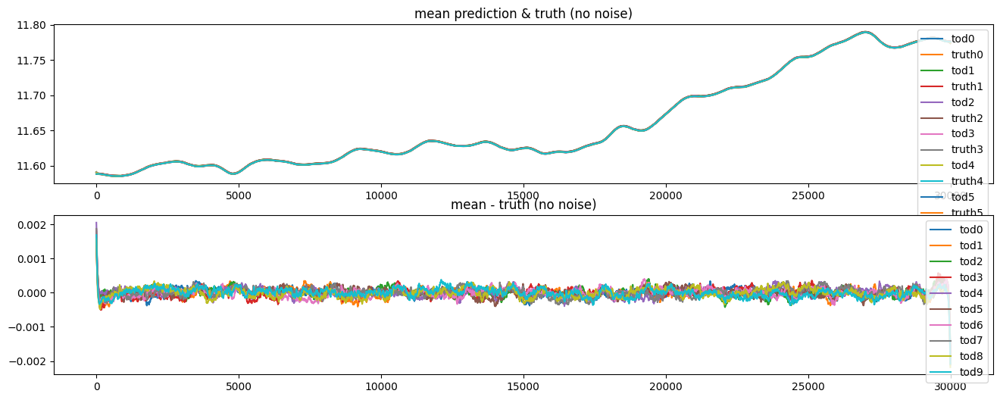

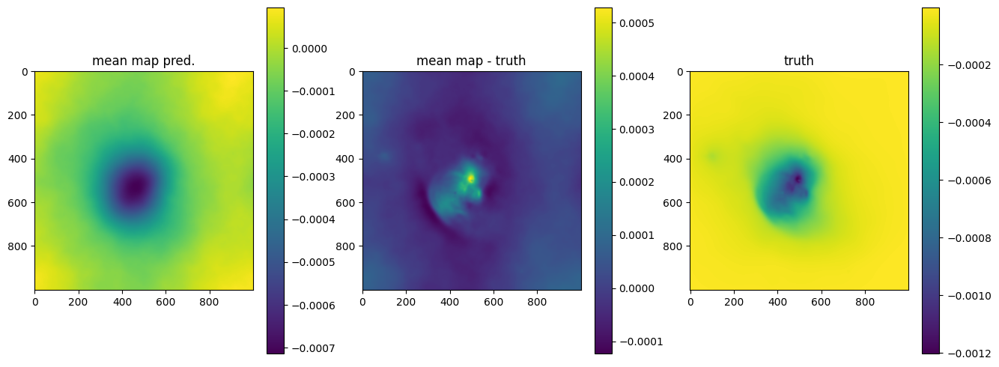

OPTIMIZE_KL: Starting 0016
SL: Iteration 0 ⛰:+2.2128e+09 Δ⛰:inf ➽:1.3200e+01
SL: Iteration 1 ⛰:+1.5832e+08 Δ⛰:2.0544e+09 ➽:1.3200e+01
SL: Iteration 2 ⛰:+7.2244e+07 Δ⛰:8.6076e+07 ➽:1.3200e+01
SL: Iteration 3 ⛰:+2.0186e+07 Δ⛰:5.2058e+07 ➽:1.3200e+01
SL: Iteration 4 ⛰:+1.3149e+07 Δ⛰:7.0366e+06 ➽:1.3200e+01
SL: Iteration 5 ⛰:+5.0897e+06 Δ⛰:8.0596e+06 ➽:1.3200e+01
SL: Iteration 6 ⛰:+3.8913e+06 Δ⛰:1.1984e+06 ➽:1.3200e+01
SL: Iteration 7 ⛰:+3.8158e+06 Δ⛰:7.5524e+04 ➽:1.3200e+01
SL: Iteration 8 ⛰:+1.6525e+06 Δ⛰:2.1633e+06 ➽:1.3200e+01
SL: Iteration 9 ⛰:+1.1871e+06 Δ⛰:4.6537e+05 ➽:1.3200e+01
SL: Iteration 10 ⛰:+1.0330e+06 Δ⛰:1.5406e+05 ➽:1.3200e+01
SL: Iteration 11 ⛰:+9.4716e+05 Δ⛰:8.5881e+04 ➽:1.3200e+01
SL: Iteration 12 ⛰:+5.9558e+05 Δ⛰:3.5158e+05 ➽:1.3200e+01
SL: Iteration 13 ⛰:+3.7892e+05 Δ⛰:2.1666e+05 ➽:1.3200e+01
SL: Iteration 14 ⛰:+3.4202e+05 Δ⛰:3.6897e+04 ➽:1.3200e+01
SL: Iteration 15 ⛰:+2.6303e+05 Δ⛰:7.8991e+04 ➽:1.3200e+01
SL: Iteration 16 ⛰:-2.0995e+04 Δ⛰:2.8403e+05 ➽:1.3200e+01
SL: 

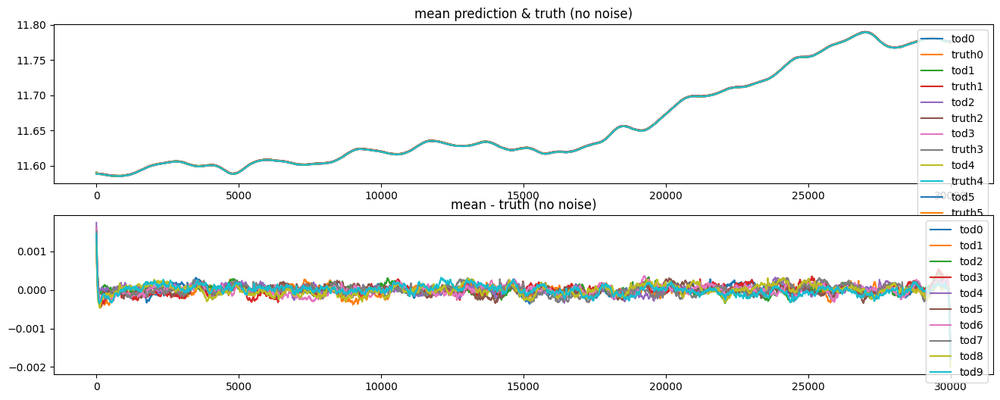

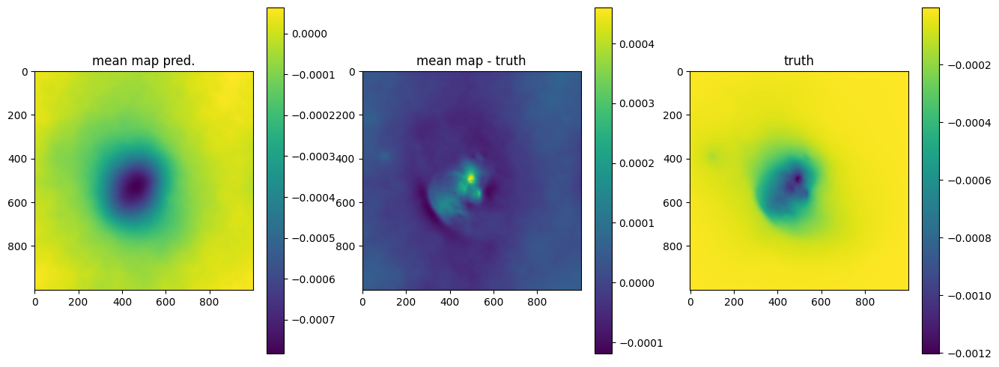

OPTIMIZE_KL: Starting 0017
SL: Iteration 0 ⛰:+5.9573e+08 Δ⛰:inf ➽:1.3200e+01
SL: Iteration 1 ⛰:+2.9035e+08 Δ⛰:3.0538e+08 ➽:1.3200e+01
SL: Iteration 2 ⛰:+9.1279e+07 Δ⛰:1.9907e+08 ➽:1.3200e+01
SL: Iteration 3 ⛰:+1.1505e+07 Δ⛰:7.9773e+07 ➽:1.3200e+01
SL: Iteration 4 ⛰:+8.8852e+06 Δ⛰:2.6201e+06 ➽:1.3200e+01
SL: Iteration 5 ⛰:+5.8982e+06 Δ⛰:2.9870e+06 ➽:1.3200e+01
SL: Iteration 6 ⛰:+3.7674e+06 Δ⛰:2.1308e+06 ➽:1.3200e+01
SL: Iteration 7 ⛰:+3.5765e+06 Δ⛰:1.9092e+05 ➽:1.3200e+01
SL: Iteration 8 ⛰:+1.1169e+06 Δ⛰:2.4596e+06 ➽:1.3200e+01
SL: Iteration 9 ⛰:+7.5193e+05 Δ⛰:3.6494e+05 ➽:1.3200e+01
SL: Iteration 10 ⛰:+7.4068e+05 Δ⛰:1.1255e+04 ➽:1.3200e+01
SL: Iteration 11 ⛰:+6.7668e+05 Δ⛰:6.3993e+04 ➽:1.3200e+01
SL: Iteration 12 ⛰:+6.7652e+05 Δ⛰:1.6406e+02 ➽:1.3200e+01
SL: Iteration 13 ⛰:+1.9990e+05 Δ⛰:4.7662e+05 ➽:1.3200e+01
SL: Iteration 14 ⛰:+1.4736e+05 Δ⛰:5.2536e+04 ➽:1.3200e+01
SL: Iteration 15 ⛰:+1.1559e+05 Δ⛰:3.1776e+04 ➽:1.3200e+01
SL: Iteration 16 ⛰:-7.1114e+04 Δ⛰:1.8670e+05 ➽:1.3200e+01
SL: 

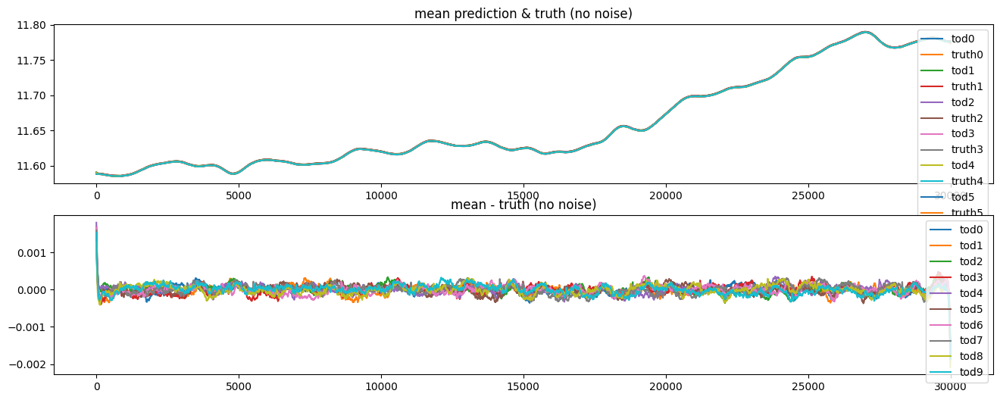

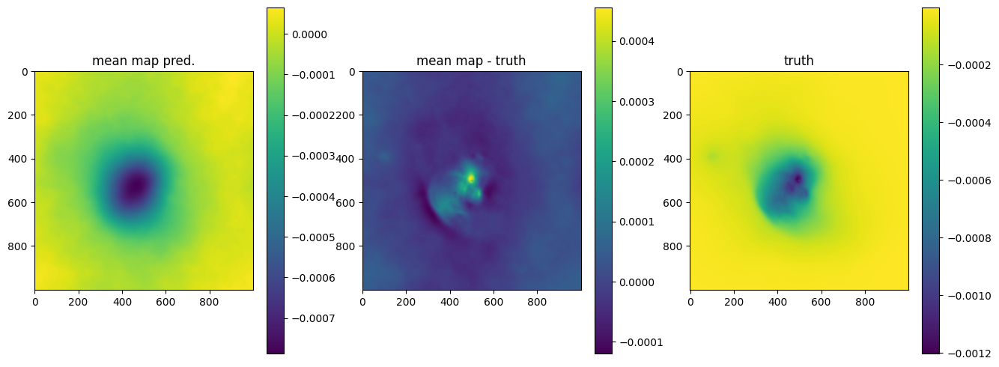

OPTIMIZE_KL: Starting 0018
SL: Iteration 0 ⛰:+5.5294e+09 Δ⛰:inf ➽:1.3200e+01
SL: Iteration 1 ⛰:+6.8773e+08 Δ⛰:4.8417e+09 ➽:1.3200e+01
SL: Iteration 2 ⛰:+1.5183e+08 Δ⛰:5.3589e+08 ➽:1.3200e+01
SL: Iteration 3 ⛰:+1.8724e+07 Δ⛰:1.3311e+08 ➽:1.3200e+01
SL: Iteration 4 ⛰:+1.2647e+07 Δ⛰:6.0776e+06 ➽:1.3200e+01
SL: Iteration 5 ⛰:+6.7717e+06 Δ⛰:5.8750e+06 ➽:1.3200e+01
SL: Iteration 6 ⛰:+3.2948e+06 Δ⛰:3.4768e+06 ➽:1.3200e+01
SL: Iteration 7 ⛰:+3.2887e+06 Δ⛰:6.1646e+03 ➽:1.3200e+01
SL: Iteration 8 ⛰:+1.1739e+06 Δ⛰:2.1148e+06 ➽:1.3200e+01
SL: Iteration 9 ⛰:+9.9618e+05 Δ⛰:1.7772e+05 ➽:1.3200e+01
SL: Iteration 10 ⛰:+6.9400e+05 Δ⛰:3.0218e+05 ➽:1.3200e+01
SL: Iteration 11 ⛰:+6.1535e+05 Δ⛰:7.8649e+04 ➽:1.3200e+01
SL: Iteration 12 ⛰:+5.8859e+05 Δ⛰:2.6758e+04 ➽:1.3200e+01
SL: Iteration 13 ⛰:+1.6324e+05 Δ⛰:4.2535e+05 ➽:1.3200e+01
SL: Iteration 14 ⛰:+1.2724e+05 Δ⛰:3.6004e+04 ➽:1.3200e+01
SL: Iteration 15 ⛰:+5.2455e+04 Δ⛰:7.4783e+04 ➽:1.3200e+01
SL: Iteration 16 ⛰:-1.6938e+05 Δ⛰:2.2184e+05 ➽:1.3200e+01
SL: 

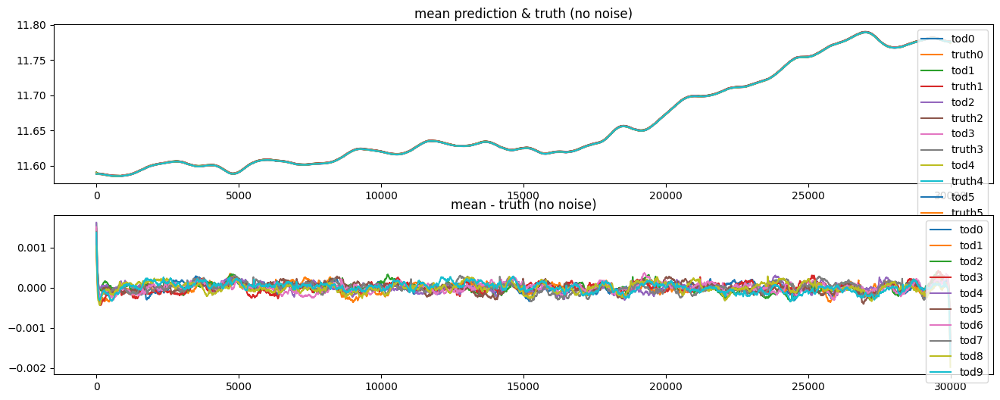

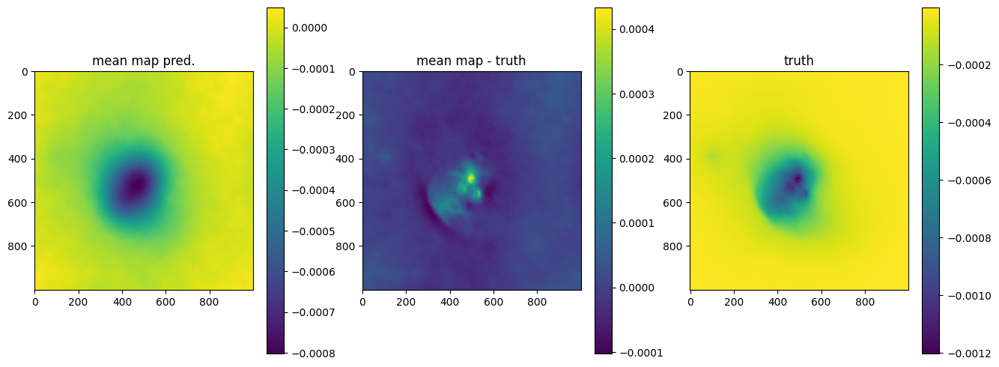

OPTIMIZE_KL: Starting 0019
SL: Iteration 0 ⛰:+3.0792e+08 Δ⛰:inf ➽:1.3200e+01
SL: Iteration 1 ⛰:+9.0819e+07 Δ⛰:2.1710e+08 ➽:1.3200e+01
SL: Iteration 2 ⛰:+7.5138e+07 Δ⛰:1.5682e+07 ➽:1.3200e+01
SL: Iteration 3 ⛰:+2.0720e+07 Δ⛰:5.4417e+07 ➽:1.3200e+01
SL: Iteration 4 ⛰:+1.2500e+07 Δ⛰:8.2206e+06 ➽:1.3200e+01
SL: Iteration 5 ⛰:+5.4756e+06 Δ⛰:7.0241e+06 ➽:1.3200e+01
SL: Iteration 6 ⛰:+3.8001e+06 Δ⛰:1.6755e+06 ➽:1.3200e+01
SL: Iteration 7 ⛰:+3.7683e+06 Δ⛰:3.1728e+04 ➽:1.3200e+01
SL: Iteration 8 ⛰:+1.3737e+06 Δ⛰:2.3947e+06 ➽:1.3200e+01
SL: Iteration 9 ⛰:+9.0301e+05 Δ⛰:4.7065e+05 ➽:1.3200e+01
SL: Iteration 10 ⛰:+7.9706e+05 Δ⛰:1.0595e+05 ➽:1.3200e+01
SL: Iteration 11 ⛰:+7.8377e+05 Δ⛰:1.3288e+04 ➽:1.3200e+01
SL: Iteration 12 ⛰:+7.8269e+05 Δ⛰:1.0830e+03 ➽:1.3200e+01
SL: Iteration 13 ⛰:+2.0396e+05 Δ⛰:5.7873e+05 ➽:1.3200e+01
SL: Iteration 14 ⛰:+1.1104e+05 Δ⛰:9.2917e+04 ➽:1.3200e+01
SL: Iteration 15 ⛰:-1.4289e+04 Δ⛰:1.2533e+05 ➽:1.3200e+01
SL: Iteration 16 ⛰:-2.0439e+05 Δ⛰:1.9010e+05 ➽:1.3200e+01
SL: 

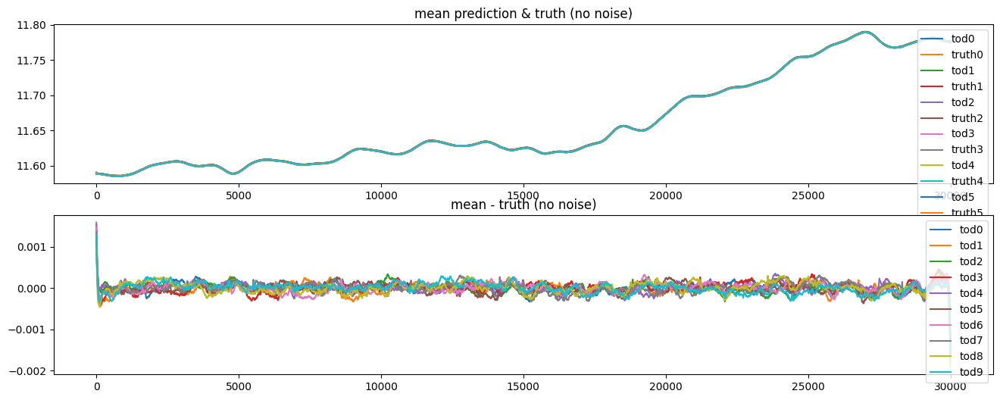

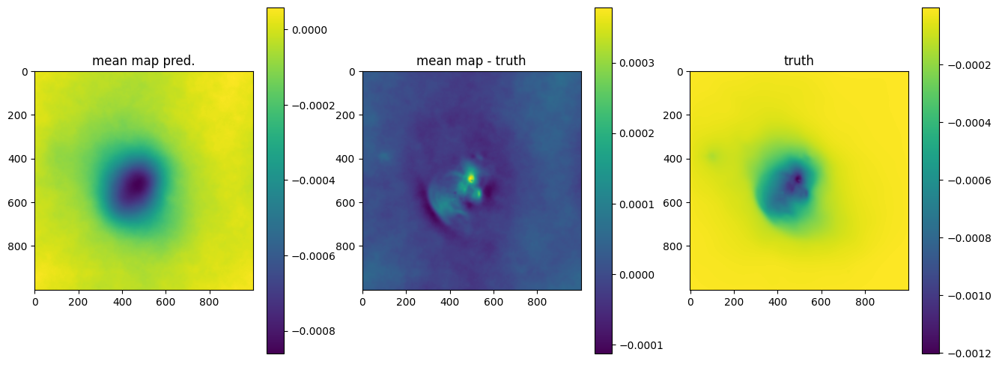

OPTIMIZE_KL: Starting 0020
SL: Iteration 0 ⛰:+8.2262e+07 Δ⛰:inf ➽:1.3200e+01
SL: Iteration 1 ⛰:+7.7804e+07 Δ⛰:4.4578e+06 ➽:1.3200e+01
SL: Iteration 2 ⛰:+6.7267e+07 Δ⛰:1.0537e+07 ➽:1.3200e+01
SL: Iteration 3 ⛰:+1.2891e+07 Δ⛰:5.4376e+07 ➽:1.3200e+01
SL: Iteration 4 ⛰:+6.7959e+06 Δ⛰:6.0950e+06 ➽:1.3200e+01
SL: Iteration 5 ⛰:+5.1666e+06 Δ⛰:1.6293e+06 ➽:1.3200e+01
SL: Iteration 6 ⛰:+2.8615e+06 Δ⛰:2.3051e+06 ➽:1.3200e+01
SL: Iteration 7 ⛰:+2.8605e+06 Δ⛰:9.7353e+02 ➽:1.3200e+01
SL: Iteration 8 ⛰:+7.8701e+05 Δ⛰:2.0735e+06 ➽:1.3200e+01
SL: Iteration 9 ⛰:+7.0342e+05 Δ⛰:8.3593e+04 ➽:1.3200e+01
SL: Iteration 10 ⛰:+4.0730e+05 Δ⛰:2.9612e+05 ➽:1.3200e+01
SL: Iteration 11 ⛰:+4.0454e+05 Δ⛰:2.7664e+03 ➽:1.3200e+01
SL: Iteration 12 ⛰:+1.8763e+05 Δ⛰:2.1690e+05 ➽:1.3200e+01
SL: Iteration 13 ⛰:-1.0109e+04 Δ⛰:1.9774e+05 ➽:1.3200e+01
SL: Iteration 14 ⛰:-3.1006e+04 Δ⛰:2.0897e+04 ➽:1.3200e+01
SL: Iteration 15 ⛰:-8.2757e+04 Δ⛰:5.1751e+04 ➽:1.3200e+01
SL: Iteration 16 ⛰:-2.5909e+05 Δ⛰:1.7633e+05 ➽:1.3200e+01
SL: 

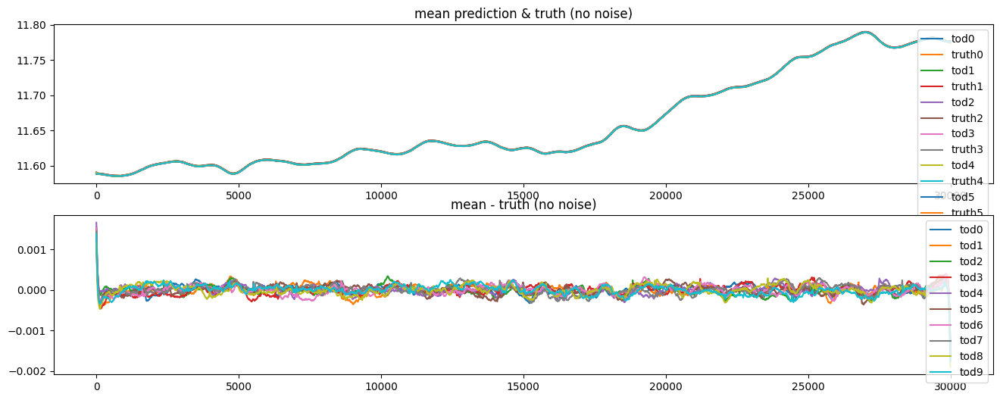

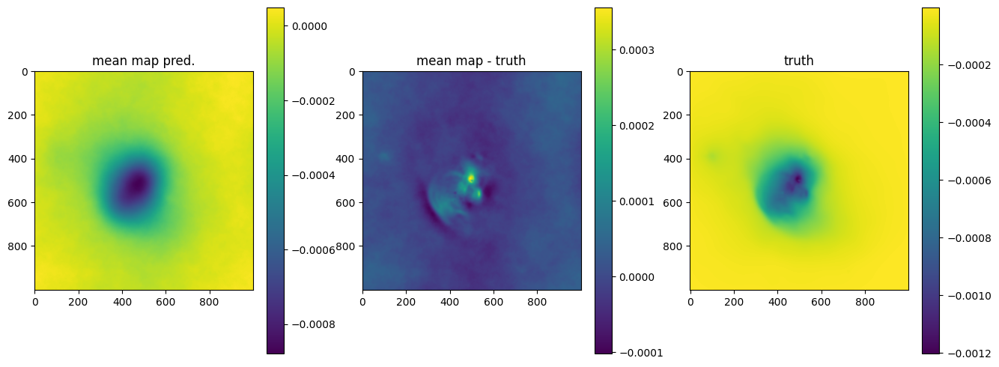

OPTIMIZE_KL: Starting 0021
SL: Iteration 0 ⛰:+9.0602e+09 Δ⛰:inf ➽:1.3200e+01
SL: Iteration 1 ⛰:+9.2444e+07 Δ⛰:8.9677e+09 ➽:1.3200e+01
SL: Iteration 2 ⛰:+7.9947e+07 Δ⛰:1.2498e+07 ➽:1.3200e+01
SL: Iteration 3 ⛰:+1.9663e+07 Δ⛰:6.0284e+07 ➽:1.3200e+01
SL: Iteration 4 ⛰:+8.6860e+06 Δ⛰:1.0977e+07 ➽:1.3200e+01
SL: Iteration 5 ⛰:+4.2820e+06 Δ⛰:4.4039e+06 ➽:1.3200e+01
SL: Iteration 6 ⛰:+3.8456e+06 Δ⛰:4.3648e+05 ➽:1.3200e+01
SL: Iteration 7 ⛰:+2.4313e+06 Δ⛰:1.4143e+06 ➽:1.3200e+01
SL: Iteration 8 ⛰:+6.3788e+05 Δ⛰:1.7934e+06 ➽:1.3200e+01
SL: Iteration 9 ⛰:+2.8921e+05 Δ⛰:3.4867e+05 ➽:1.3200e+01
SL: Iteration 10 ⛰:+2.4130e+05 Δ⛰:4.7909e+04 ➽:1.3200e+01
SL: Iteration 11 ⛰:+2.4059e+05 Δ⛰:7.0480e+02 ➽:1.3200e+01
SL: Iteration 12 ⛰:+2.4024e+05 Δ⛰:3.5787e+02 ➽:1.3200e+01
SL: Iteration 13 ⛰:-7.5007e+03 Δ⛰:2.4774e+05 ➽:1.3200e+01
SL: Iteration 14 ⛰:-1.1107e+05 Δ⛰:1.0357e+05 ➽:1.3200e+01
SL: Iteration 15 ⛰:-1.7088e+05 Δ⛰:5.9812e+04 ➽:1.3200e+01
SL: Iteration 16 ⛰:-3.2534e+05 Δ⛰:1.5446e+05 ➽:1.3200e+01
SL: 

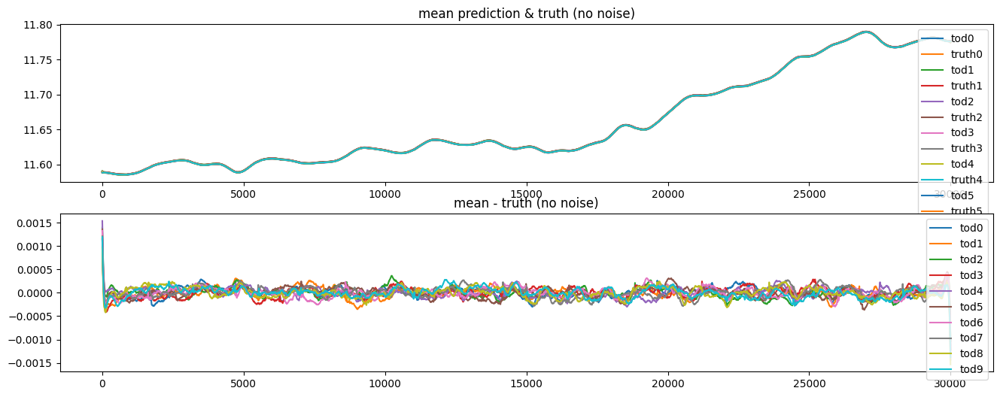

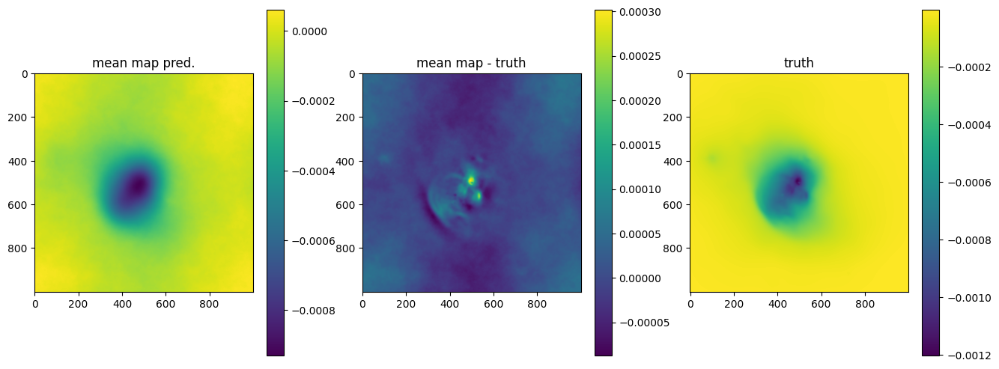

OPTIMIZE_KL: Starting 0022
SL: Iteration 0 ⛰:+3.6474e+08 Δ⛰:inf ➽:1.3200e+01
SL: Iteration 1 ⛰:+1.5244e+08 Δ⛰:2.1230e+08 ➽:1.3200e+01
SL: Iteration 2 ⛰:+1.0628e+08 Δ⛰:4.6155e+07 ➽:1.3200e+01
SL: Iteration 3 ⛰:+8.9194e+06 Δ⛰:9.7363e+07 ➽:1.3200e+01
SL: Iteration 4 ⛰:+6.8640e+06 Δ⛰:2.0553e+06 ➽:1.3200e+01
SL: Iteration 5 ⛰:+4.8206e+06 Δ⛰:2.0434e+06 ➽:1.3200e+01
SL: Iteration 6 ⛰:+2.2175e+06 Δ⛰:2.6031e+06 ➽:1.3200e+01
SL: Iteration 7 ⛰:+2.2111e+06 Δ⛰:6.4192e+03 ➽:1.3200e+01
SL: Iteration 8 ⛰:+8.0196e+05 Δ⛰:1.4091e+06 ➽:1.3200e+01
SL: Iteration 9 ⛰:+6.2187e+05 Δ⛰:1.8009e+05 ➽:1.3200e+01
SL: Iteration 10 ⛰:+2.8928e+05 Δ⛰:3.3259e+05 ➽:1.3200e+01
SL: Iteration 11 ⛰:+2.7695e+05 Δ⛰:1.2330e+04 ➽:1.3200e+01
SL: Iteration 12 ⛰:+2.7223e+05 Δ⛰:4.7215e+03 ➽:1.3200e+01
SL: Iteration 13 ⛰:+1.9299e+04 Δ⛰:2.5293e+05 ➽:1.3200e+01
SL: Iteration 14 ⛰:-3.0160e+04 Δ⛰:4.9460e+04 ➽:1.3200e+01
SL: Iteration 15 ⛰:-1.7218e+05 Δ⛰:1.4202e+05 ➽:1.3200e+01
SL: Iteration 16 ⛰:-3.0658e+05 Δ⛰:1.3440e+05 ➽:1.3200e+01
SL: 

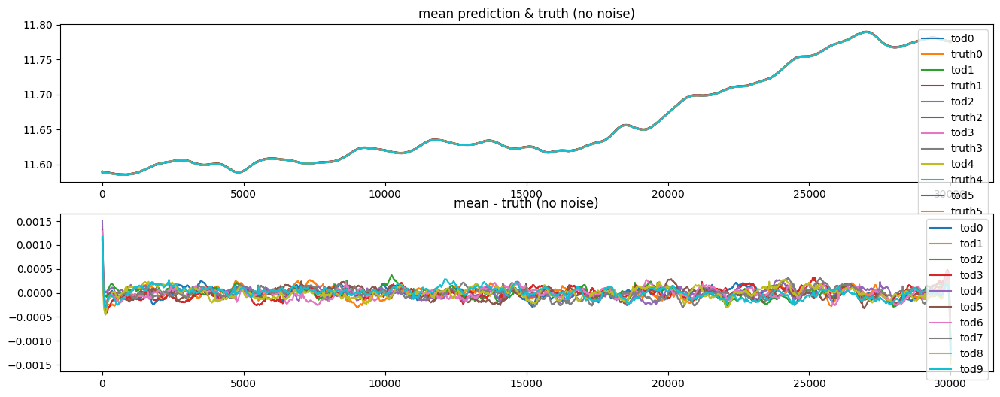

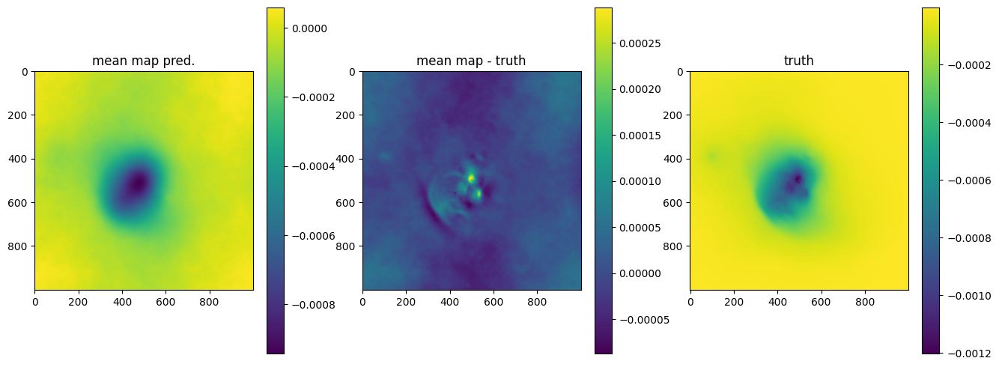

OPTIMIZE_KL: Starting 0023
SL: Iteration 0 ⛰:+4.6140e+08 Δ⛰:inf ➽:1.3200e+01
SL: Iteration 1 ⛰:+1.1401e+08 Δ⛰:3.4739e+08 ➽:1.3200e+01
SL: Iteration 2 ⛰:+1.0035e+08 Δ⛰:1.3663e+07 ➽:1.3200e+01
SL: Iteration 3 ⛰:+1.9613e+07 Δ⛰:8.0734e+07 ➽:1.3200e+01
SL: Iteration 4 ⛰:+1.2224e+07 Δ⛰:7.3881e+06 ➽:1.3200e+01
SL: Iteration 5 ⛰:+5.6154e+06 Δ⛰:6.6091e+06 ➽:1.3200e+01
SL: Iteration 6 ⛰:+2.1791e+06 Δ⛰:3.4363e+06 ➽:1.3200e+01
SL: Iteration 7 ⛰:+2.1778e+06 Δ⛰:1.3351e+03 ➽:1.3200e+01
SL: Iteration 8 ⛰:+5.5208e+05 Δ⛰:1.6257e+06 ➽:1.3200e+01
SL: Iteration 9 ⛰:+4.4144e+05 Δ⛰:1.1064e+05 ➽:1.3200e+01
SL: Iteration 10 ⛰:+1.2188e+05 Δ⛰:3.1955e+05 ➽:1.3200e+01
SL: Iteration 11 ⛰:+1.2124e+05 Δ⛰:6.4050e+02 ➽:1.3200e+01
SL: Iteration 12 ⛰:+9.8344e+04 Δ⛰:2.2899e+04 ➽:1.3200e+01
SL: Iteration 13 ⛰:-1.5331e+05 Δ⛰:2.5166e+05 ➽:1.3200e+01
SL: Iteration 14 ⛰:-1.9444e+05 Δ⛰:4.1127e+04 ➽:1.3200e+01
SL: Iteration 15 ⛰:-2.4757e+05 Δ⛰:5.3126e+04 ➽:1.3200e+01
SL: Iteration 16 ⛰:-3.4913e+05 Δ⛰:1.0157e+05 ➽:1.3200e+01
SL: 

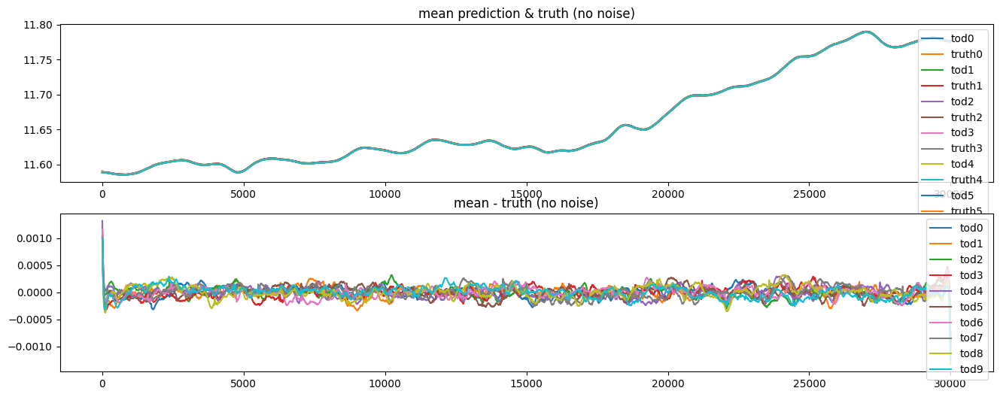

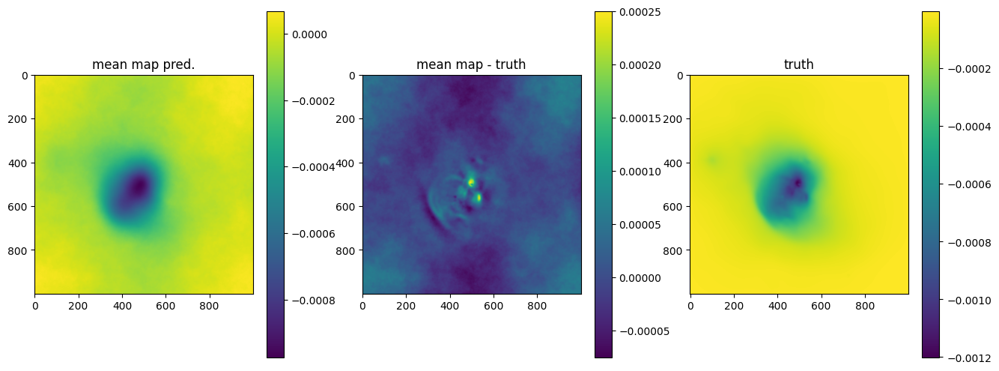

OPTIMIZE_KL: Starting 0024
SL: Iteration 0 ⛰:+1.1036e+10 Δ⛰:inf ➽:1.3200e+01
SL: Iteration 1 ⛰:+1.0894e+08 Δ⛰:1.0927e+10 ➽:1.3200e+01
SL: Iteration 2 ⛰:+5.0474e+07 Δ⛰:5.8464e+07 ➽:1.3200e+01
SL: Iteration 3 ⛰:+1.2008e+07 Δ⛰:3.8466e+07 ➽:1.3200e+01
SL: Iteration 4 ⛰:+7.5948e+06 Δ⛰:4.4128e+06 ➽:1.3200e+01
SL: Iteration 5 ⛰:+3.9625e+06 Δ⛰:3.6323e+06 ➽:1.3200e+01
SL: Iteration 6 ⛰:+3.5653e+06 Δ⛰:3.9722e+05 ➽:1.3200e+01
SL: Iteration 7 ⛰:+2.4495e+06 Δ⛰:1.1158e+06 ➽:1.3200e+01
SL: Iteration 8 ⛰:+7.7737e+05 Δ⛰:1.6721e+06 ➽:1.3200e+01
SL: Iteration 9 ⛰:+6.5768e+05 Δ⛰:1.1969e+05 ➽:1.3200e+01
SL: Iteration 10 ⛰:+3.9540e+05 Δ⛰:2.6227e+05 ➽:1.3200e+01
SL: Iteration 11 ⛰:+3.4890e+05 Δ⛰:4.6500e+04 ➽:1.3200e+01
SL: Iteration 12 ⛰:+3.4886e+05 Δ⛰:3.9210e+01 ➽:1.3200e+01
SL: Iteration 13 ⛰:+1.0011e+05 Δ⛰:2.4875e+05 ➽:1.3200e+01
SL: Iteration 14 ⛰:+4.2598e+04 Δ⛰:5.7514e+04 ➽:1.3200e+01
SL: Iteration 15 ⛰:-1.3902e+05 Δ⛰:1.8162e+05 ➽:1.3200e+01
SL: Iteration 16 ⛰:-2.8189e+05 Δ⛰:1.4287e+05 ➽:1.3200e+01
SL: 

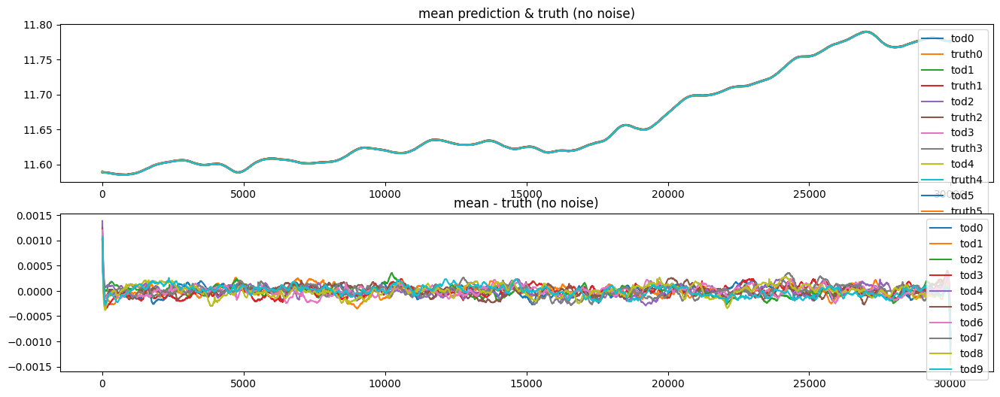

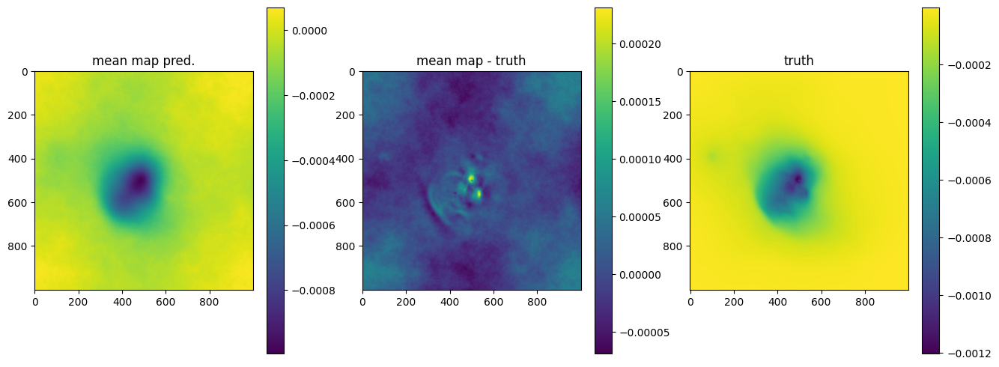

OPTIMIZE_KL: Starting 0025
SL: Iteration 0 ⛰:+8.3429e+08 Δ⛰:inf ➽:1.3200e+01
SL: Iteration 1 ⛰:+3.1942e+08 Δ⛰:5.1487e+08 ➽:1.3200e+01
SL: Iteration 2 ⛰:+1.7802e+08 Δ⛰:1.4139e+08 ➽:1.3200e+01
SL: Iteration 3 ⛰:+1.6191e+07 Δ⛰:1.6183e+08 ➽:1.3200e+01
SL: Iteration 4 ⛰:+1.2351e+07 Δ⛰:3.8402e+06 ➽:1.3200e+01
SL: Iteration 5 ⛰:+6.4255e+06 Δ⛰:5.9253e+06 ➽:1.3200e+01
SL: Iteration 6 ⛰:+2.5525e+06 Δ⛰:3.8729e+06 ➽:1.3200e+01
SL: Iteration 7 ⛰:+2.5350e+06 Δ⛰:1.7544e+04 ➽:1.3200e+01
SL: Iteration 8 ⛰:+4.1814e+05 Δ⛰:2.1168e+06 ➽:1.3200e+01
SL: Iteration 9 ⛰:+2.7047e+05 Δ⛰:1.4767e+05 ➽:1.3200e+01
SL: Iteration 10 ⛰:+1.3400e+05 Δ⛰:1.3647e+05 ➽:1.3200e+01
SL: Iteration 11 ⛰:+8.1830e+04 Δ⛰:5.2169e+04 ➽:1.3200e+01
SL: Iteration 12 ⛰:+7.9669e+04 Δ⛰:2.1614e+03 ➽:1.3200e+01
SL: Iteration 13 ⛰:-1.7273e+05 Δ⛰:2.5240e+05 ➽:1.3200e+01
SL: Iteration 14 ⛰:-2.0693e+05 Δ⛰:3.4200e+04 ➽:1.3200e+01
SL: Iteration 15 ⛰:-2.7612e+05 Δ⛰:6.9191e+04 ➽:1.3200e+01
SL: Iteration 16 ⛰:-2.8868e+05 Δ⛰:1.2566e+04 ➽:1.3200e+01
SL: 

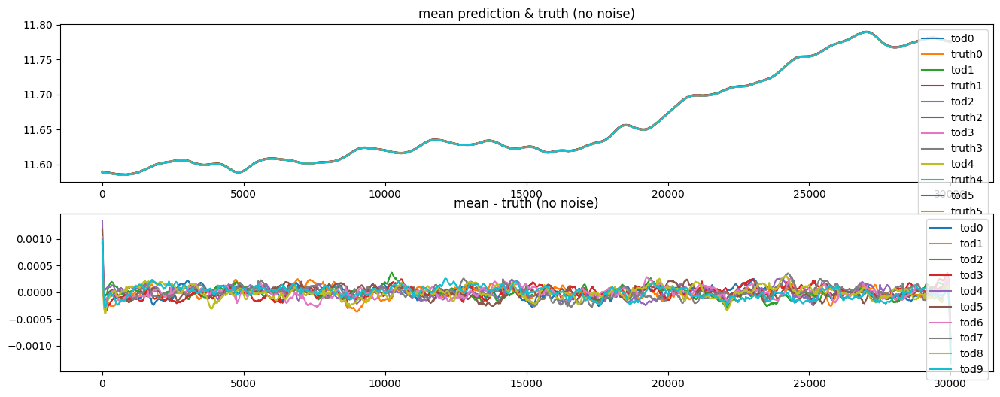

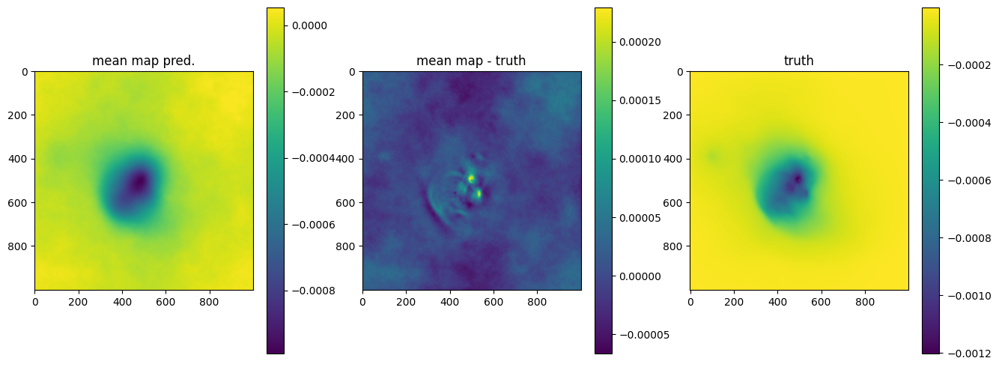

OPTIMIZE_KL: Starting 0026
SL: Iteration 0 ⛰:+8.8995e+08 Δ⛰:inf ➽:1.3200e+01
SL: Iteration 1 ⛰:+1.4520e+08 Δ⛰:7.4475e+08 ➽:1.3200e+01
SL: Iteration 2 ⛰:+1.2356e+08 Δ⛰:2.1643e+07 ➽:1.3200e+01
SL: Iteration 3 ⛰:+1.1177e+07 Δ⛰:1.1238e+08 ➽:1.3200e+01
SL: Iteration 4 ⛰:+8.7078e+06 Δ⛰:2.4690e+06 ➽:1.3200e+01
SL: Iteration 5 ⛰:+4.6388e+06 Δ⛰:4.0690e+06 ➽:1.3200e+01
SL: Iteration 6 ⛰:+2.8299e+06 Δ⛰:1.8090e+06 ➽:1.3200e+01
SL: Iteration 7 ⛰:+2.8150e+06 Δ⛰:1.4816e+04 ➽:1.3200e+01
SL: Iteration 8 ⛰:+1.2203e+06 Δ⛰:1.5947e+06 ➽:1.3200e+01
SL: Iteration 9 ⛰:+7.1819e+05 Δ⛰:5.0215e+05 ➽:1.3200e+01
SL: Iteration 10 ⛰:+3.4962e+05 Δ⛰:3.6857e+05 ➽:1.3200e+01
SL: Iteration 11 ⛰:+1.5506e+05 Δ⛰:1.9456e+05 ➽:1.3200e+01
SL: Iteration 12 ⛰:+1.5350e+05 Δ⛰:1.5533e+03 ➽:1.3200e+01
SL: Iteration 13 ⛰:+1.4640e+05 Δ⛰:7.0992e+03 ➽:1.3200e+01
SL: Iteration 14 ⛰:+1.0467e+05 Δ⛰:4.1739e+04 ➽:1.3200e+01
SL: Iteration 15 ⛰:-1.2441e+05 Δ⛰:2.2908e+05 ➽:1.3200e+01
SL: Iteration 16 ⛰:-2.8884e+05 Δ⛰:1.6443e+05 ➽:1.3200e+01
SL: 

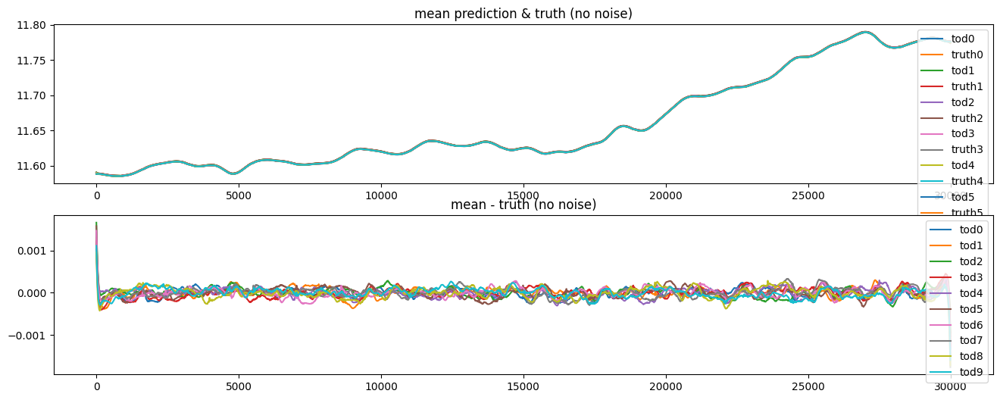

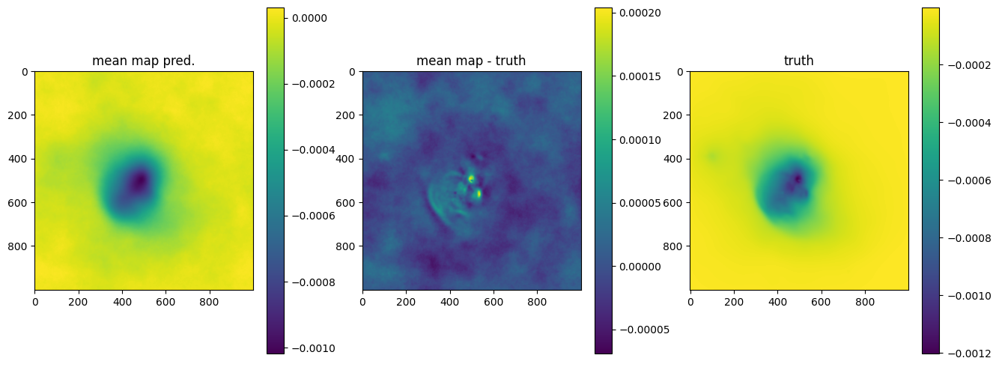

OPTIMIZE_KL: Starting 0027
SL: Iteration 0 ⛰:+1.4709e+08 Δ⛰:inf ➽:1.3200e+01
SL: Iteration 1 ⛰:+1.2921e+08 Δ⛰:1.7884e+07 ➽:1.3200e+01
SL: Iteration 2 ⛰:+1.1718e+07 Δ⛰:1.1749e+08 ➽:1.3200e+01
SL: Iteration 3 ⛰:+1.1462e+07 Δ⛰:2.5607e+05 ➽:1.3200e+01
SL: Iteration 4 ⛰:+9.2733e+06 Δ⛰:2.1885e+06 ➽:1.3200e+01
SL: Iteration 5 ⛰:+4.7236e+06 Δ⛰:4.5497e+06 ➽:1.3200e+01
SL: Iteration 6 ⛰:+2.3806e+06 Δ⛰:2.3431e+06 ➽:1.3200e+01
SL: Iteration 7 ⛰:+2.3750e+06 Δ⛰:5.5545e+03 ➽:1.3200e+01
SL: Iteration 8 ⛰:+8.3893e+05 Δ⛰:1.5361e+06 ➽:1.3200e+01
SL: Iteration 9 ⛰:+6.7645e+05 Δ⛰:1.6248e+05 ➽:1.3200e+01
SL: Iteration 10 ⛰:+2.4961e+05 Δ⛰:4.2684e+05 ➽:1.3200e+01
SL: Iteration 11 ⛰:+1.2112e+05 Δ⛰:1.2849e+05 ➽:1.3200e+01
SL: Iteration 12 ⛰:+1.2008e+05 Δ⛰:1.0473e+03 ➽:1.3200e+01
SL: Iteration 13 ⛰:+1.1421e+05 Δ⛰:5.8653e+03 ➽:1.3200e+01
SL: Iteration 14 ⛰:+7.6187e+04 Δ⛰:3.8023e+04 ➽:1.3200e+01
SL: Iteration 15 ⛰:-1.7620e+05 Δ⛰:2.5239e+05 ➽:1.3200e+01
SL: Iteration 16 ⛰:-2.3569e+05 Δ⛰:5.9487e+04 ➽:1.3200e+01
SL: 

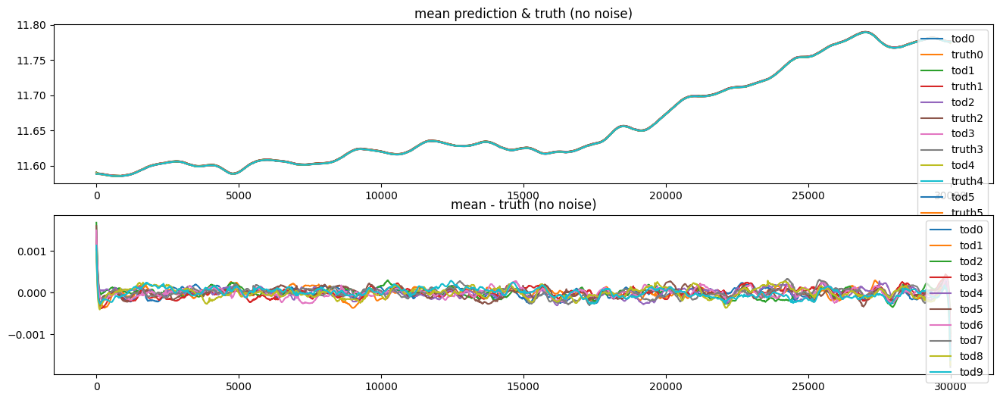

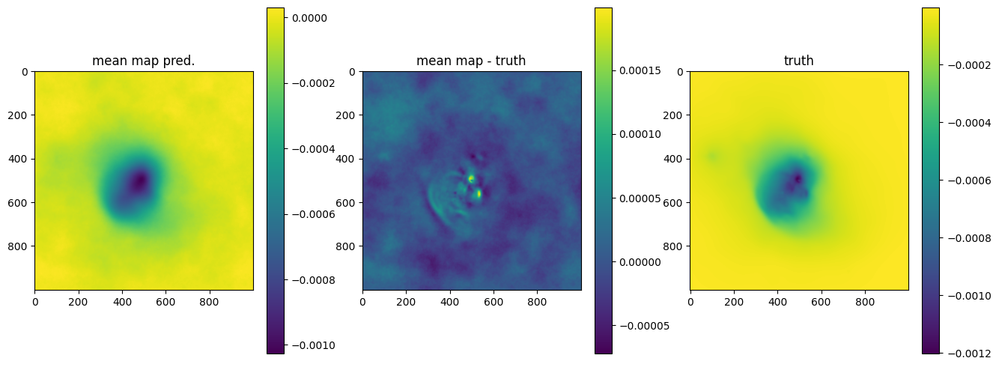

OPTIMIZE_KL: Starting 0028
SL: Iteration 0 ⛰:+1.3069e+08 Δ⛰:inf ➽:1.3200e+01
SL: Iteration 1 ⛰:+1.2956e+08 Δ⛰:1.1319e+06 ➽:1.3200e+01
SL: Iteration 2 ⛰:+4.1017e+07 Δ⛰:8.8542e+07 ➽:1.3200e+01
SL: Iteration 3 ⛰:+1.0838e+07 Δ⛰:3.0178e+07 ➽:1.3200e+01
SL: Iteration 4 ⛰:+8.1663e+06 Δ⛰:2.6717e+06 ➽:1.3200e+01
SL: Iteration 5 ⛰:+3.9927e+06 Δ⛰:4.1736e+06 ➽:1.3200e+01
SL: Iteration 6 ⛰:+2.2127e+06 Δ⛰:1.7800e+06 ➽:1.3200e+01
SL: Iteration 7 ⛰:+2.2123e+06 Δ⛰:4.1190e+02 ➽:1.3200e+01
SL: Iteration 8 ⛰:+8.2708e+05 Δ⛰:1.3852e+06 ➽:1.3200e+01
SL: Iteration 9 ⛰:+5.9259e+05 Δ⛰:2.3449e+05 ➽:1.3200e+01
SL: Iteration 10 ⛰:+2.1455e+05 Δ⛰:3.7803e+05 ➽:1.3200e+01
SL: Iteration 11 ⛰:+2.1336e+05 Δ⛰:1.1893e+03 ➽:1.3200e+01
SL: Iteration 12 ⛰:+6.1900e+04 Δ⛰:1.5146e+05 ➽:1.3200e+01
SL: Iteration 13 ⛰:+6.1439e+04 Δ⛰:4.6097e+02 ➽:1.3200e+01
SL: Iteration 14 ⛰:+3.1104e+04 Δ⛰:3.0335e+04 ➽:1.3200e+01
SL: Iteration 15 ⛰:-2.2652e+05 Δ⛰:2.5763e+05 ➽:1.3200e+01
SL: Iteration 16 ⛰:-3.2652e+05 Δ⛰:9.9999e+04 ➽:1.3200e+01
SL: 

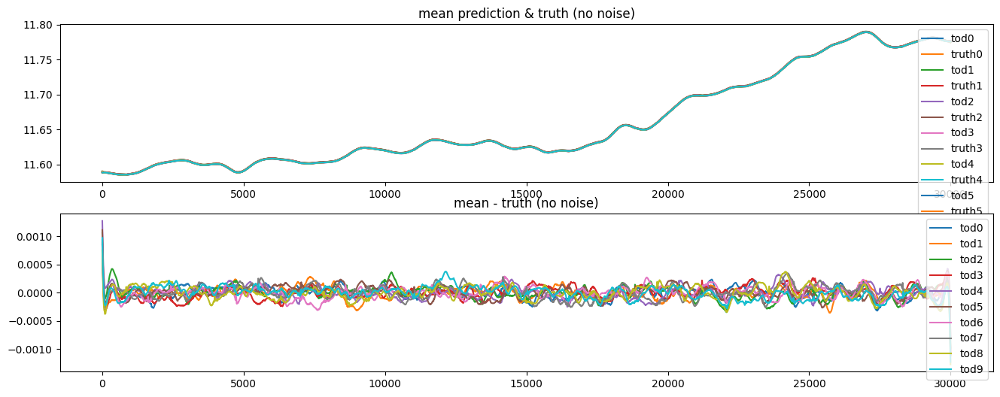

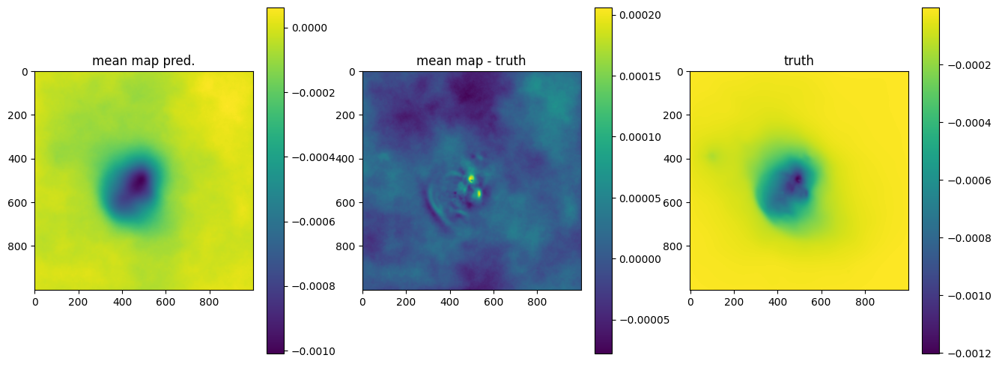

OPTIMIZE_KL: Starting 0029
SL: Iteration 0 ⛰:+7.2536e+09 Δ⛰:inf ➽:1.3200e+01
SL: Iteration 1 ⛰:+1.7259e+08 Δ⛰:7.0810e+09 ➽:1.3200e+01
SL: Iteration 2 ⛰:+1.1778e+08 Δ⛰:5.4809e+07 ➽:1.3200e+01
SL: Iteration 3 ⛰:+1.9496e+07 Δ⛰:9.8281e+07 ➽:1.3200e+01
SL: Iteration 4 ⛰:+1.3855e+07 Δ⛰:5.6410e+06 ➽:1.3200e+01
SL: Iteration 5 ⛰:+4.8581e+06 Δ⛰:8.9967e+06 ➽:1.3200e+01
SL: Iteration 6 ⛰:+2.6927e+06 Δ⛰:2.1654e+06 ➽:1.3200e+01
SL: Iteration 7 ⛰:+2.4178e+06 Δ⛰:2.7482e+05 ➽:1.3200e+01
SL: Iteration 8 ⛰:+1.4312e+06 Δ⛰:9.8669e+05 ➽:1.3200e+01
SL: Iteration 9 ⛰:+1.2534e+06 Δ⛰:1.7773e+05 ➽:1.3200e+01
SL: Iteration 10 ⛰:+1.7376e+05 Δ⛰:1.0797e+06 ➽:1.3200e+01
SL: Iteration 11 ⛰:+1.7233e+05 Δ⛰:1.4297e+03 ➽:1.3200e+01
SL: Iteration 12 ⛰:+1.7036e+05 Δ⛰:1.9698e+03 ➽:1.3200e+01
SL: Iteration 13 ⛰:+1.7364e+04 Δ⛰:1.5300e+05 ➽:1.3200e+01
SL: Iteration 14 ⛰:-2.2637e+04 Δ⛰:4.0001e+04 ➽:1.3200e+01
SL: Iteration 15 ⛰:-2.8780e+05 Δ⛰:2.6516e+05 ➽:1.3200e+01
SL: Iteration 16 ⛰:-3.4631e+05 Δ⛰:5.8511e+04 ➽:1.3200e+01
SL: 

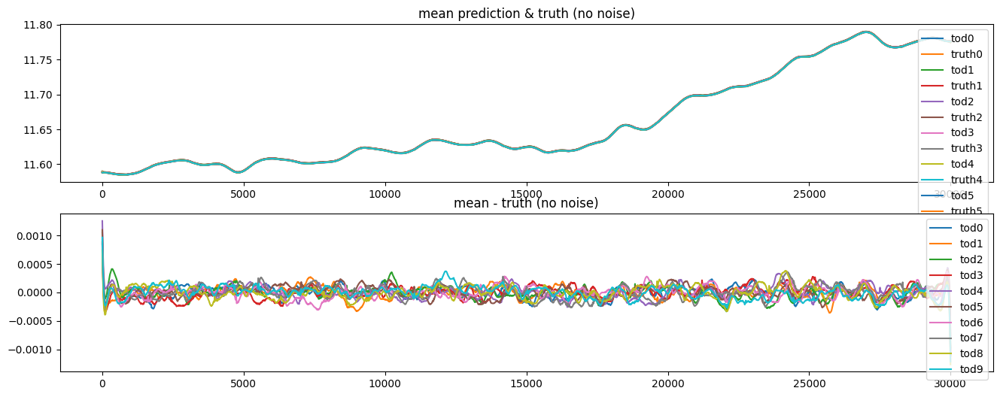

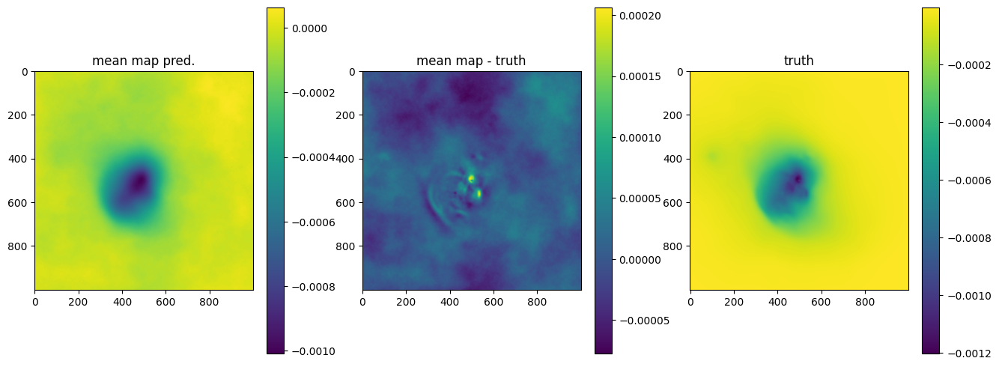

OPTIMIZE_KL: Starting 0030
SL: Iteration 0 ⛰:+1.3440e+08 Δ⛰:inf ➽:1.3200e+01
SL: Iteration 1 ⛰:+1.0884e+08 Δ⛰:2.5559e+07 ➽:1.3200e+01
SL: Iteration 2 ⛰:+9.2487e+07 Δ⛰:1.6352e+07 ➽:1.3200e+01
SL: Iteration 3 ⛰:+1.3373e+07 Δ⛰:7.9113e+07 ➽:1.3200e+01
SL: Iteration 4 ⛰:+9.9298e+06 Δ⛰:3.4433e+06 ➽:1.3200e+01
SL: Iteration 5 ⛰:+3.6885e+06 Δ⛰:6.2413e+06 ➽:1.3200e+01
SL: Iteration 6 ⛰:+2.1190e+06 Δ⛰:1.5695e+06 ➽:1.3200e+01
SL: Iteration 7 ⛰:+2.1174e+06 Δ⛰:1.6099e+03 ➽:1.3200e+01
SL: Iteration 8 ⛰:+1.1810e+06 Δ⛰:9.3644e+05 ➽:1.3200e+01
SL: Iteration 9 ⛰:+8.8174e+05 Δ⛰:2.9922e+05 ➽:1.3200e+01
SL: Iteration 10 ⛰:+2.6240e+05 Δ⛰:6.1935e+05 ➽:1.3200e+01
SL: Iteration 11 ⛰:+2.6127e+05 Δ⛰:1.1217e+03 ➽:1.3200e+01
SL: Iteration 12 ⛰:+2.0795e+05 Δ⛰:5.3329e+04 ➽:1.3200e+01
SL: Iteration 13 ⛰:+1.3099e+05 Δ⛰:7.6956e+04 ➽:1.3200e+01
SL: Iteration 14 ⛰:+8.5311e+04 Δ⛰:4.5679e+04 ➽:1.3200e+01
SL: Iteration 15 ⛰:-2.2290e+05 Δ⛰:3.0821e+05 ➽:1.3200e+01
SL: Iteration 16 ⛰:-3.3147e+05 Δ⛰:1.0857e+05 ➽:1.3200e+01
SL: 

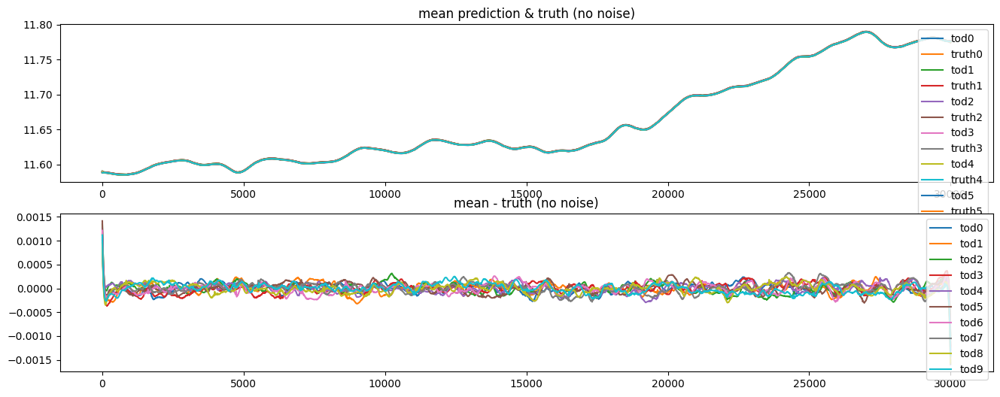

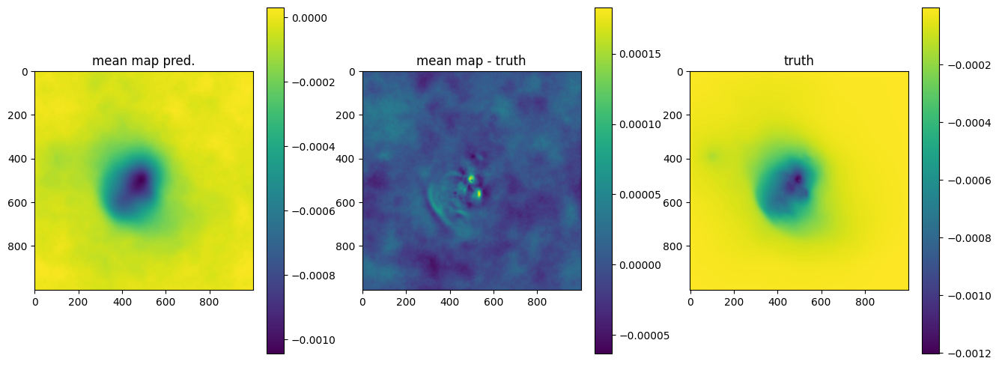

In [24]:
n_it = 30
# n_it = 40
# delta = 1e-4 # default
# delta = 1e-8 # map
# tod
# if noiselevel == 0.0: delta = 1e-6
if noiselevel == 0.0: delta = 1e-4
# if noiselevel == 0.0: delta = 1e-11
elif noiselevel == 0.1: delta = 1e-10
elif noiselevel == 0.5: delta = 1e-10
elif noiselevel == 1.0: delta = 1e-4
n_samples = 4 # no samples -> maximum aposteriory posterior

key, k_i, k_o = random.split(key, 3)

# callback fn for plotting during optimisation:
def callback(samples, opt_state):
    mean, std = jft.mean_and_std(tuple(signal_response_tod(s) for s in samples))

    fig_tods, axes_tods = plt.subplots(2, 1, figsize=(16, 6))

    # for i in range(0, mean.shape[0], mean.shape[0]//10):
    for i in range(n):
        axes_tods[0].plot(np.arange(0, mean.shape[1]), mean[i], label=f"tod{i}")
        axes_tods[0].plot(denoised_jax_tod[i], label=f"truth{i}")
        axes_tods[1].plot(np.arange(0, mean.shape[1]), mean[i] - denoised_jax_tod[i], label=f"tod{i}")

    axes_tods[0].title.set_text('mean prediction & truth (no noise)')
    axes_tods[0].legend()
    axes_tods[1].title.set_text('mean - truth (no noise)')
    axes_tods[1].legend()

    fig_map, axes_map = plt.subplots(1, 3, figsize=(16, 6))

    mean_map, _ = jft.mean_and_std(tuple(gp_map(s) for s in samples))

    im0 = axes_map[0].imshow(mean_map)
    axes_map[0].title.set_text('mean map pred.')
    fig_map.colorbar(im0)

    im1 = axes_map[1].imshow(mean_map - mapdata_truth[0])
    axes_map[1].title.set_text('mean map - truth')
    fig_map.colorbar(im1)

    im2 = axes_map[2].imshow(mapdata_truth[0])
    axes_map[2].title.set_text('truth')
    fig_map.colorbar(im2)

    plt.show()
    

samples, state = jft.optimize_kl(
    lh, # likelihood
    jft.Vector(lh.init(k_i)), # initial position in model space (initialisation)
    n_total_iterations=n_it, # no of optimisation steps (global)
    n_samples=n_samples, # draw samples
    key=k_o, # random jax init
    draw_linear_kwargs=dict( # sampling parameters
        cg_name="SL",
        cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=60),
        # cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=10),
    ),
    nonlinearly_update_kwargs=dict( # map from multivariate gaussian to more compl. distribution (coordinate transformations)
        minimize_kwargs=dict(
            name="SN",
            xtol=delta,
            cg_kwargs=dict(name=None),
            maxiter=5,
        )
    ),
    kl_kwargs=dict( # shift transformed multivar gauss to best match true posterior
        minimize_kwargs=dict(
            name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=60
            # name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=10
        )
    ),
    # sample_mode="nonlinear_resample", # how steps are combined (samples + nonlin + KL)
    sample_mode = lambda x: "nonlinear_resample" if x >= 1 else "linear_resample",
    callback=callback,
)

In [25]:
printfitresults()

Fit Results (res, init, std)

TODs:
	fluctuations: 0.006750969340864251, 0.005, 0.003
	loglogvarslope: -3.4683558696597654, -3, 0.5
	zeromode std (LogNormal): 0.00047501846241220543, 0.0005, 0.001
map:
	fluctuations: 1.9094616473846723e-05, 2e-06, 1e-06
	loglogvarslope: -2.650804384943483, -2.5, 0.5
	zeromode std (LogNormal): 7.728195514081031e-10, 1e-08, 1e-07


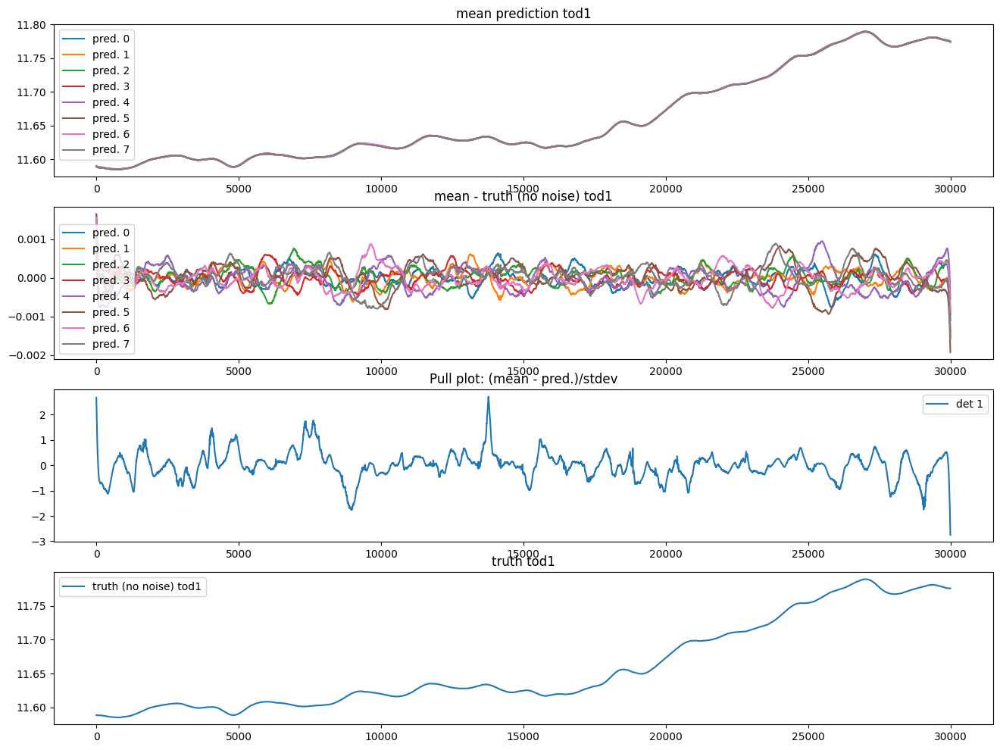

In [26]:
mean, std = jft.mean_and_std(tuple(signal_response_tod(s) for s in samples))

fig, axes = plt.subplots(4, 1, figsize=(16, 12))
i = 1 # TOD id
j = 0
# for i in range(mean.shape[0]):
for s in samples:
    pred = signal_response_tod(s)
    
    im0 = axes[0].plot(np.arange(0, pred.shape[1]), pred[i], label=f"pred. {j}")
    im1 = axes[1].plot(np.arange(0, pred.shape[1]), pred[i] - denoised_jax_tod[i], label=f"pred. {j}")
    j += 1

im2 = axes[2].plot(np.arange(0, pred.shape[1]), (mean[i] - denoised_jax_tod[i])/std[i], label=f"det {i}")
im3 = axes[3].plot(denoised_jax_tod[i], label=f"truth (no noise) tod{i}")
axes[0].title.set_text(f"mean prediction tod{i}")
axes[0].legend()
axes[1].title.set_text(f"mean - truth (no noise) tod{i}")
axes[1].legend()
axes[2].title.set_text(f"Pull plot: (mean - pred.)/stdev")
axes[2].legend()
axes[3].title.set_text(f"truth tod{i}")
axes[3].legend()

plt.show()

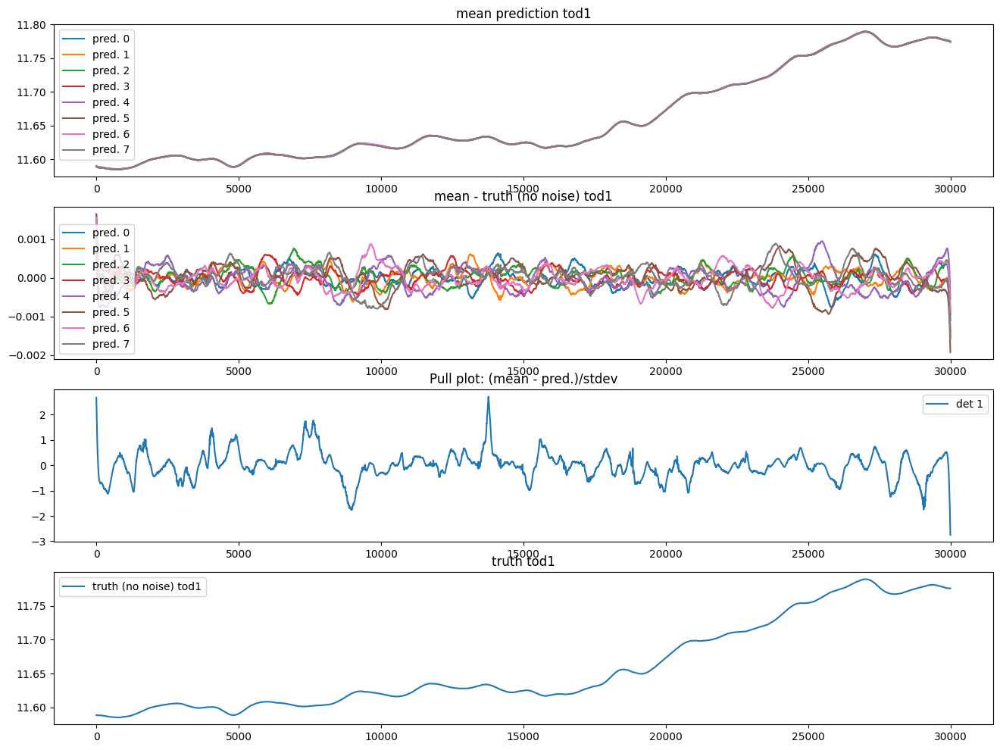

In [27]:
fig, axes = plt.subplots(4, 1, figsize=(16, 12))
i = 1 # TOD id
j = 0
# for i in range(mean.shape[0]):
for s in samples:
    pred = signal_response_tod(s)
    
    im0 = axes[0].plot(np.arange(0, pred.shape[1]), pred[i], label=f"pred. {j}")
    im1 = axes[1].plot(np.arange(0, pred.shape[1]), pred[i] - denoised_jax_tod[i], label=f"pred. {j}")
    j += 1

im2 = axes[2].plot(np.arange(0, pred.shape[1]), (mean[i] - denoised_jax_tod[i])/std[i], label=f"det {i}")
im3 = axes[3].plot(denoised_jax_tod[i], label=f"truth (no noise) tod{i}")
axes[0].title.set_text(f"mean prediction tod{i}")
axes[0].legend()
axes[1].title.set_text(f"mean - truth (no noise) tod{i}")
axes[1].legend()
axes[2].title.set_text(f"Pull plot: (mean - pred.)/stdev")
axes[2].legend()
axes[3].title.set_text(f"truth tod{i}")
axes[3].legend()

plt.show()

## Compare with maria mapper:

In [28]:
# # Re-run simulation without noise for fair comp:
# # instrument = maria.get_instrument('MUSTANG-2')
# instrument = mapsampling_jax.instrument
# instrument.plot()

# sim_truthmap = maria.Simulation(instrument, 
#                                 plan=plan,
#                                 site="llano_de_chajnantor", 
#                                 map=input_map,
#                                 noise=False,
#                                 atmosphere="2d",
#                                 # cmb="generate",
#                                 )

# tod_truthmap = sim_truthmap.run()

In [29]:
# Compare with maria mapper:
from maria.map.mappers import BinMapper

mapper = BinMapper(center=(150, 10),
                   frame="ra_dec",
                   width=0.1,
                   height=0.1,
                   resolution=2e-4,
                   tod_postprocessing={
                        "remove_modes": {"n": 1},
                        # "highpass": {"f": 0.01},
                        "despline": {"spacing": 10},
                    },
                    map_postprocessing={
                        "gaussian_filter": {"sigma": 1},
                        "median_filter": {"size": 1},
                    },
                  )

mapper.add_tods(tod_truthmap)
output_map = mapper.run()

Running mapper (m2/f093): 100%|██████████| 1/1 [00:06<00:00,  6.13s/it]


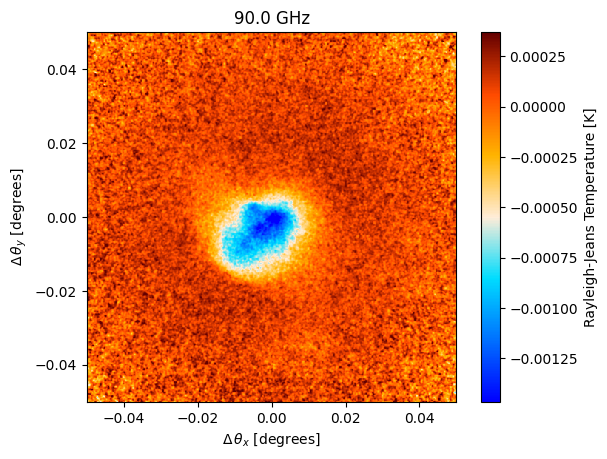

In [30]:
output_map.plot()

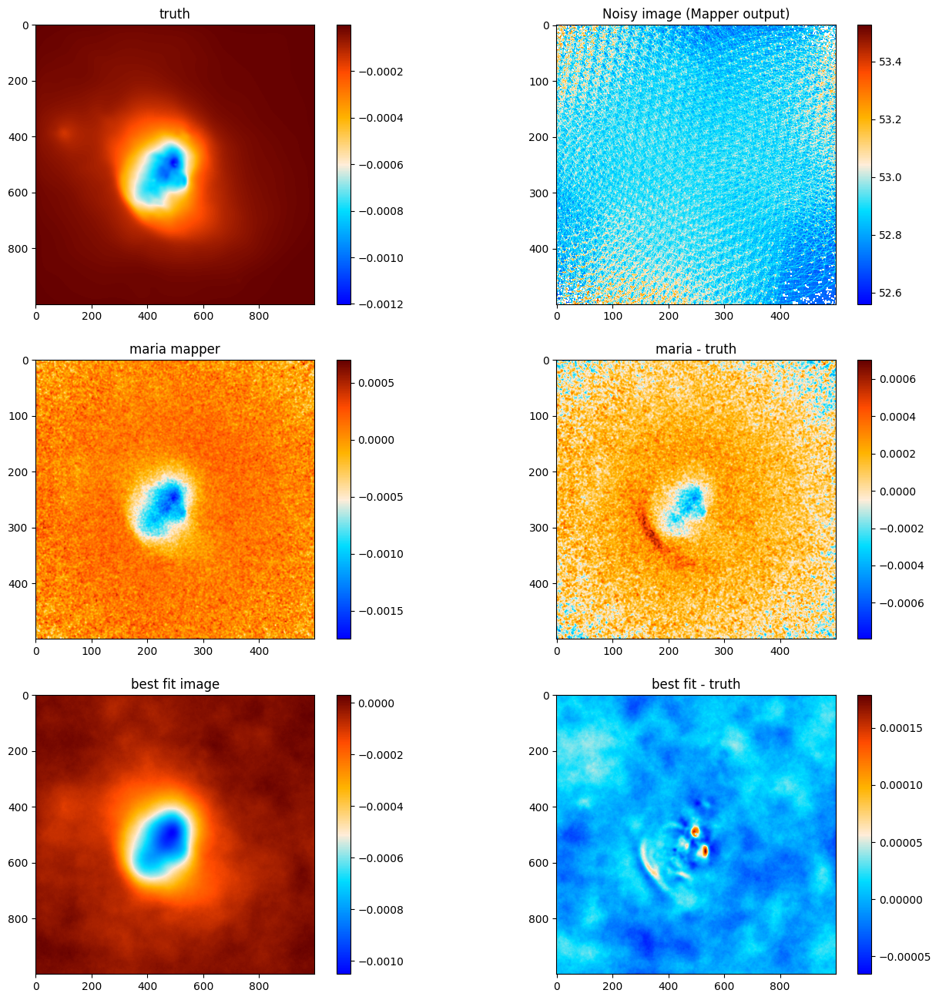

In [31]:
from skimage.transform import resize

# Compare nifty vs maria
sig_map = gp_map(samples.pos) # when splitting up in different field models
# mincol = -0.0012
# maxcol = 0.
mincol = None
maxcol = None

cmb_cmap = plt.get_cmap('cmb')
fig, axes = plt.subplots(3, 2, figsize=(16, 16))

im0 = axes[0,0].imshow( mapdata_truth[0] , cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[0,0].title.set_text('truth')
fig.colorbar(im0)

im1 = axes[0,1].imshow(np.flip(output_truthmap.data[0], axis=(0,1)), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
fig.colorbar(im1)
axes[0,1].title.set_text("Noisy image (Mapper output)")

im2 = axes[1,0].imshow( np.flip(output_map.data[0], axis=(0,1)), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[1,0].title.set_text('maria mapper')
fig.colorbar(im2)

truth_rescaled = resize(mapdata_truth[0], (500, 500), anti_aliasing=True)
im3 = axes[1,1].imshow(( np.flip(output_map.data[0], axis=(0,1)) - truth_rescaled), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[1,1].title.set_text('maria - truth')
fig.colorbar(im3)

im3 = axes[2,0].imshow(sig_map, cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[2,0].title.set_text('best fit image')
fig.colorbar(im3)

im4 = axes[2,1].imshow((sig_map - mapdata_truth[0]), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
axes[2,1].title.set_text('best fit - truth')
fig.colorbar(im4)

plt.show()